In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output
import pandas as pd
from sklearn.gaussian_process import GaussianProcessRegressor, GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF, Matern, RationalQuadratic, WhiteKernel, ConstantKernel, ExpSineSquared
from scipy.optimize import minimize
import scipy.stats
import ast  
from sklearn.metrics import mean_squared_error, r2_score
import warnings
from matplotlib import gridspec
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from itertools import combinations
from mpl_toolkits.mplot3d import Axes3D
from sklearn.utils import resample
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from scipy.stats import pearsonr, norm
from sklearn.svm import SVR

**Import data and format**

In [3]:
with open("250409_new_data_points/queries.txt", "r") as file:
    queries_data = file.readlines()

In [4]:
with open("250409_new_data_points/observations.txt", "r") as file:
    observations_data = file.readlines()

In [5]:
#print(queries_data)

In [6]:
cleaned_data = " ".join(queries_data)
cleaned_data = cleaned_data.replace(",\n", ",").replace("\n", "") 
cleaned_data = cleaned_data.replace(" ", "")             
cleaned_data = cleaned_data.replace("][", ",") #Ensure commas between consecutive arrays
cleaned_data = cleaned_data.replace("array", "")  
cleaned_data = cleaned_data.replace("(", "") 
cleaned_data = cleaned_data.replace(")", "")             
print(cleaned_data)

[[0.,0.999999],[0.666025,0.288321],[0.400218,0.897066,0.789397],[1.00000e-06,9.99999e-01,1.00000e-06,1.00000e-06],[0.510148,0.816727,0.726616,0.112473],[0.896527,0.631236,0.1747,0.999999,0.627184],[0.203418,0.28774,0.362648,0.691213,0.578752,0.981885],[0.33579,0.057657,0.812674,0.62608,0.442778,0.070822,0.048059,0.524446],[0.74648,0.433825],[0.802445,0.217217],[0.130285,0.521971,0.990882],[0.765142,0.781768,0.347972,0.194798],[0.310776,0.86254,0.879484,0.957644],[0.323223,0.362613,0.445918,0.75705,0.086921],[0.057896,0.417925,0.313683,0.160273,0.334633,0.717441],[0.043946,0.248082,0.022929,0.11727,0.8136,0.344007,0.048559,0.492539],[0.418858,0.997619],[0.019405,0.790394],[9.99999e-01,1.00000e-06,9.99999e-01],[0.409787,0.444991,0.337091,0.437318],[0.446419,0.911922,0.953813,0.999999],[1.00000e-06,1.00000e-06,9.99999e-01,1.00000e-06,9.99999e-01],[1.00000e-06,3.96281e-01,3.34448e-01,7.64270e-02,2.87942e-01,7.61079e-01],[1.00000e-06,5.71630e-01,1.00000e-06,4.01725e-01,5.64139e-01,7.25270e-

In [7]:
parsed_data = ast.literal_eval(cleaned_data.strip()) 
arrays = [np.array(sublist) for sublist in parsed_data] 
#print("Parsed Data:")
#for array in arrays:
    #print(array)

In [8]:
num_functions = 8 # Number of functions 
num_iterations = len(parsed_data) // num_functions
iterations = [
    parsed_data[i * num_functions:(i + 1) * num_functions] for i in range(num_iterations) 
]
x_function_arrays = []  #Group by functions
for func_idx in range(num_functions):
    func_data = [np.array(iteration[func_idx]) for iteration in iterations]
    x_function_arrays.append(np.array(func_data))   

In [9]:
print(observations_data)

['[0.0, 0.5783529097128515, -0.10010233463955172, -32.80990053524104, 76.72349558489346, -1.9722983328877115, 0.09745771627721436, 7.9607548749434]\n', '[6.651660771311921e-40, -0.042883703736665696, -0.3901287502926078, -16.154222389917738, 1652.7244443516618, -0.23301581620934367, 1.8740901974869166, 9.8771821337579]\n', '[3.7072066652484473e-126, 0.09603578537167784, -0.5312601953219986, 0.010810420031586165, 3052.086356464891, -2.777993609083652, 1.3557203643288933, 9.5879511261171]\n', '[0.0, 0.04464881234866365, -0.10756410717741949, -35.883674393104464, 11.432740581241303, -1.1371671973638515, 1.9460108360786104, 9.5965370053054]\n', '[-2.4760311202855814e-241, -0.09786489580630468, -0.14808034531471057, -21.554049851899176, 614.6491558986286, -0.26314357578860603, 2.239046557893702, 9.4546402337251]\n', '[1.517648729565899e-192, -0.060288113467045164, -0.026625788034105372, 0.5338308808767533, 392.2104642727596, -0.256567897200658, 0.030549554135690857, 9.6882905789649]\n', '[-

In [10]:
cleaned_data_obs = " ".join(observations_data)
cleaned_data_obs = cleaned_data_obs.replace(",\n", ",").replace("\n", "") 
cleaned_data_obs = cleaned_data_obs.replace(" ", "")            
cleaned_data_obs = cleaned_data_obs.replace("][", ",") 
cleaned_data_obs = cleaned_data_obs.replace("array", "")  
cleaned_data_obs = cleaned_data_obs.replace("(", "") 
cleaned_data_obs = cleaned_data_obs.replace(")", "")             
#print(cleaned_data_obs)

In [11]:
parsed_data_obs = ast.literal_eval(cleaned_data_obs.strip()) 
arrays = [np.array(sublist) for sublist in parsed_data_obs] 
#print("Parsed Data:")
#for array in arrays:
    #print(array)

In [12]:
num_functions = 8 
num_iterations = len(parsed_data_obs) // num_functions
iterations = [
    parsed_data_obs[i * num_functions:(i + 1) * num_functions] for i in range(num_iterations) 
]
y_function_arrays = []  
for func_idx in range(num_functions):
    func_data = [np.array(iteration[func_idx]) for iteration in iterations]
    y_function_arrays.append(np.array(func_data))   

In [13]:
print(y_function_arrays)

[array([ 0.00000000e+000,  6.65166077e-040,  3.70720667e-126,
        0.00000000e+000, -2.47603112e-241,  1.51764873e-192,
       -4.78198416e-043,  4.30688796e-048,  2.55693199e-027,
       -4.09538921e-037, -9.53077813e-101, -2.94871990e-092,
       -1.28042317e-109,  2.31546115e-248,  1.78773979e-001,
        1.45020908e-001]), array([ 0.57835291, -0.0428837 ,  0.09603579,  0.04464881, -0.0978649 ,
       -0.06028811,  0.01832736,  0.00951137,  0.07777467,  0.3471739 ,
        0.25712428,  0.38513804,  0.67147196,  0.35291722,  0.57746952,
        0.60999791]), array([-0.10010233, -0.39012875, -0.5312602 , -0.10756411, -0.14808035,
       -0.02662579, -0.10672317, -0.12236097, -0.01419133, -0.0190877 ,
       -0.10940135, -0.01030457, -0.01002123, -0.03553022, -0.01947726,
       -0.02571258]), array([-3.28099005e+01, -1.61542224e+01,  1.08104200e-02, -3.58836744e+01,
       -2.15540499e+01,  5.33830881e-01,  5.57403800e-01,  6.14043822e-01,
        4.92673381e-01,  2.34706945e-01, 

In [14]:
# Loop through all functions (F1 to F8)

x_all_dict = {}
y_all_dict = {}

for i in range(1, 9):  # Loop from 1 to 8
    x_new = x_function_arrays[i - 1]  # New data
    y_new = y_function_arrays[i - 1]
    
    x_data_path = f"initial_data/function_{i}/initial_inputs.npy"
    y_data_path = f"initial_data/function_{i}/initial_outputs.npy"
    x_data_path2 = f"initial_data2/function_{i}/initial_inputs.npy"
    y_data_path2 = f"initial_data2/function_{i}/initial_outputs.npy"
    
    x_data = np.load(x_data_path)   # Load initial data
    y_data = np.load(y_data_path)
    x_data2 = np.load(x_data_path2)   # Load new initial data
    y_data2 = np.load(y_data_path2)
    
    x_all = np.vstack((x_data, x_data2, x_new))  # Combine all x data
    y_all = np.concatenate((y_data, y_data2, y_new), axis=0)  # Combine all y data
    
    x_all_dict[f"F{i}_x_all"] = x_all  # Store the results in dictionaries
    y_all_dict[f"F{i}_y_all"] = y_all  


In [126]:
#print(x_all_dict["F3_x_all"])

**Original maximums**

In [16]:
for i in range(1, 9):  # Loop from 1 to 8
    y_data_path = f"initial_data/function_{i}/initial_outputs.npy"
    y_data = np.load(y_data_path)
    max_value = np.max(y_data)  # Compute max value   
    print(f"Max value for Function {i}: {max_value}")
   

Max value for Function 1: 7.710875114502849e-16
Max value for Function 2: 0.6112052157614438
Max value for Function 3: -0.034835313350078584
Max value for Function 4: -4.025542281908162
Max value for Function 5: 1088.8596181962705
Max value for Function 6: -0.7142649478202404
Max value for Function 7: 1.3649683044991994
Max value for Function 8: 9.598482002566342


**Maximums from new data points**

In [18]:
for i in range(1, 9):  # Loop from 1 to 8
    y_data_path = f"initial_data2/function_{i}/initial_outputs.npy"
    y_data = np.load(y_data_path)
    max_value = np.max(y_data)  # Compute max value   
    print(f"Max value for Function {i}: {max_value}")
   

Max value for Function 1: 0.06591475853269306
Max value for Function 2: 0.6948320857901906
Max value for Function 3: -0.0251461434112182
Max value for Function 4: -4.279929925271194
Max value for Function 5: 2136.952983936292
Max value for Function 6: -0.9724842526915133
Max value for Function 7: 2.1146906674520287
Max value for Function 8: 9.755085388342168


**Assess current guesses**

In [20]:
#print max's
# Print the max for each key
for key, values in y_all_dict.items():
    max_value = max(values)  # Get the maximum value for the list
    print(f"Max value for {key}: {max_value}")

Max value for F1_y_all: 0.17877397856604094
Max value for F2_y_all: 0.6948320857901906
Max value for F3_y_all: -0.0100212252228312
Max value for F4_y_all: 0.614043822120188
Max value for F5_y_all: 8662.405001248297
Max value for F6_y_all: -0.12342685596595657
Max value for F7_y_all: 3.2651045046314477
Max value for F8_y_all: 9.9987327715739


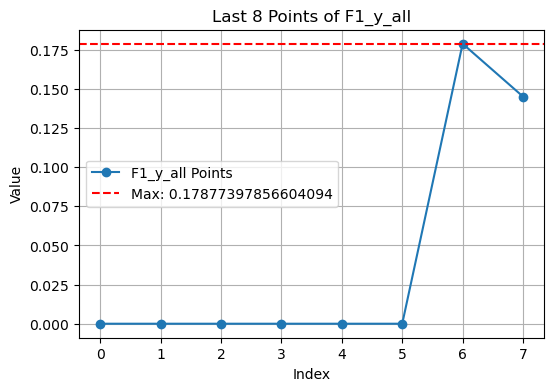

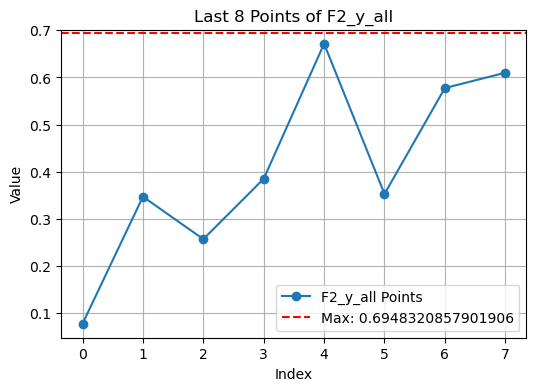

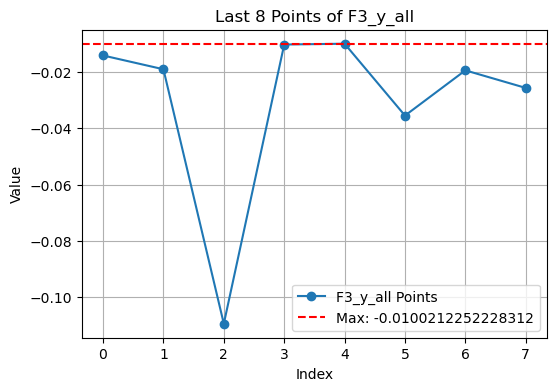

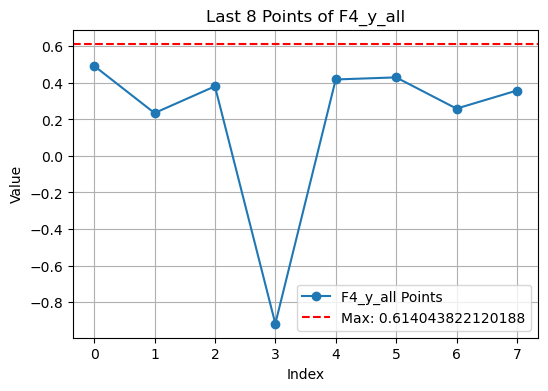

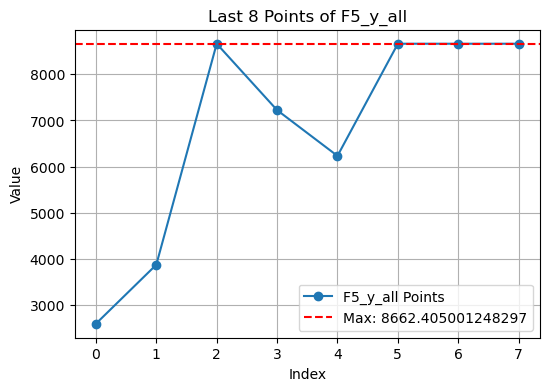

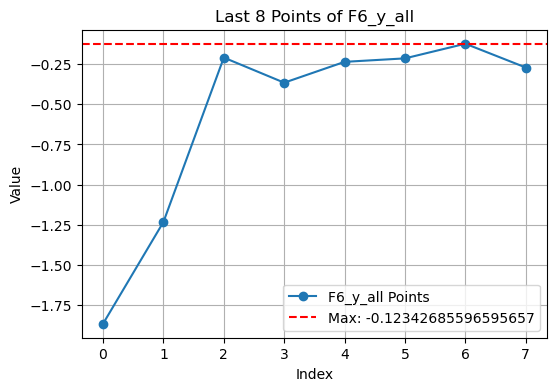

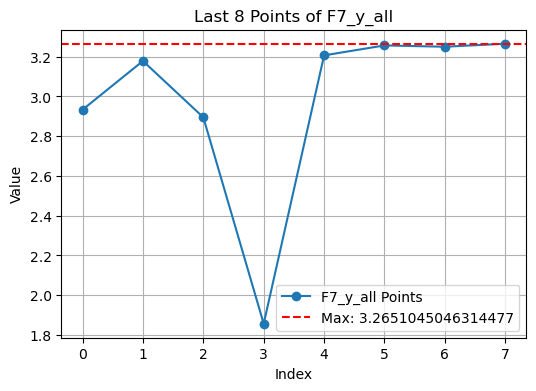

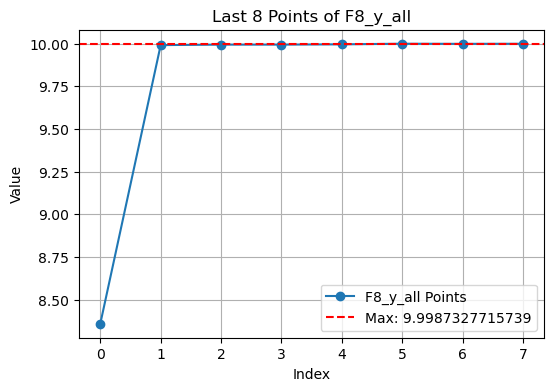

In [21]:
#plot last 8 guesses and current max
for key, values in y_all_dict.items():
    last_8_points = values[-8:]  # Get the last 4 points
    current_max = max(values)  
    plt.figure(figsize=(6, 4))
    plt.plot(range(len(last_8_points)), last_8_points, marker='o', label=f"{key} Points")
    plt.axhline(y=current_max, color='red', linestyle='--', label=f"Max: {current_max}")
    plt.title(f"Last 8 Points of {key}")
    plt.xlabel("Index")
    plt.ylabel("Value")
    plt.grid(True)
    plt.legend()
    plt.show()

**Plot all functions**

In [23]:
# create plots of all dimensions vs target
def plot_features_vs_target(x_data, y_data, title_prefix="Feature vs Target"):
    """
    Plots each feature (column of x_data) against the target y_data.
    - The last point is highlighted in a distinct color.
    - The second and third last points are highlighted in another color.
    - The fourth to seventh last points are highlighted in a third color.
    - The remaining points are plotted in the default color.

    Parameters:
        x_data (ndarray): Feature matrix (each column represents a feature).
        y_data (ndarray): Target variable.
        title_prefix (str): Prefix for subplot titles.
    """
    num_features = x_data.shape[1]  # Number of features (columns)
    num_cols = 3  # Number of columns in the grid
    num_rows = -(-num_features // num_cols)  # Calculate rows needed (ceil division)
    
    plt.figure(figsize=(5 * num_cols, 4 * num_rows))  # Dynamic figure size based on rows and columns

    # Define split indices
    last_idx = len(y_data) - 1  # Last point
    last_2_3_idx = max(len(y_data) - 3, 0)  # Last 2-3 points
    last_4_7_idx = max(len(y_data) - 7, 0)  # Last 4-7 points
    regular_idx = max(len(y_data) - 8, 0)  # Remaining points

    for i in range(num_features):
        plt.subplot(num_rows, num_cols, i + 1)  # Create subplots in a grid
        
        # Plot regular points
        plt.scatter(x_data[:regular_idx, i], y_data[:regular_idx], alpha=0.7, label="Regular", color="grey")
        
        # Plot last 4-7 points in orange
        plt.scatter(x_data[last_4_7_idx:last_2_3_idx, i], y_data[last_4_7_idx:last_2_3_idx], alpha=0.7, label="Last 4-7", color="green")
        
        # Plot last 2-3 points in green
        plt.scatter(x_data[last_2_3_idx:last_idx, i], y_data[last_2_3_idx:last_idx], alpha=0.7, label="Last 2-3", color="orange")
        
        # Plot last point in red
        plt.scatter(x_data[last_idx:, i], y_data[last_idx:], alpha=0.9, label="Last Point", color="red", edgecolors="black", s=80)
        
        plt.title(f"{title_prefix}: x{i+1} vs y")
        plt.xlabel(f"x{i+1}")
        plt.ylabel("y") 
        plt.legend()

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()


Generating plots for F1


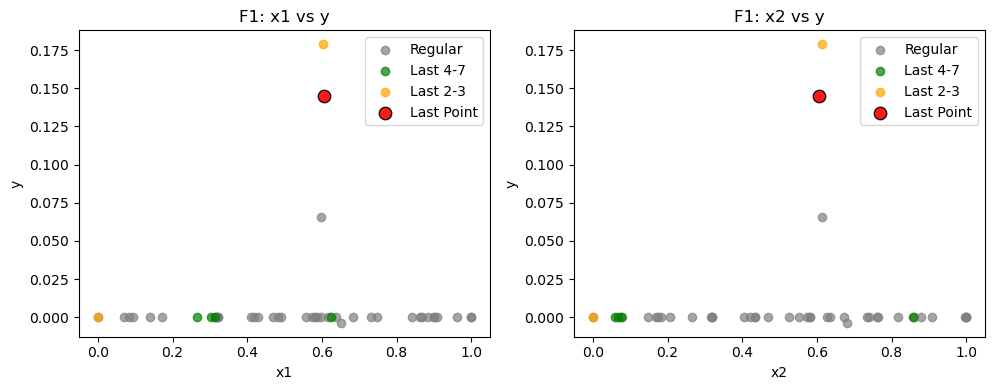

Generating plots for F2


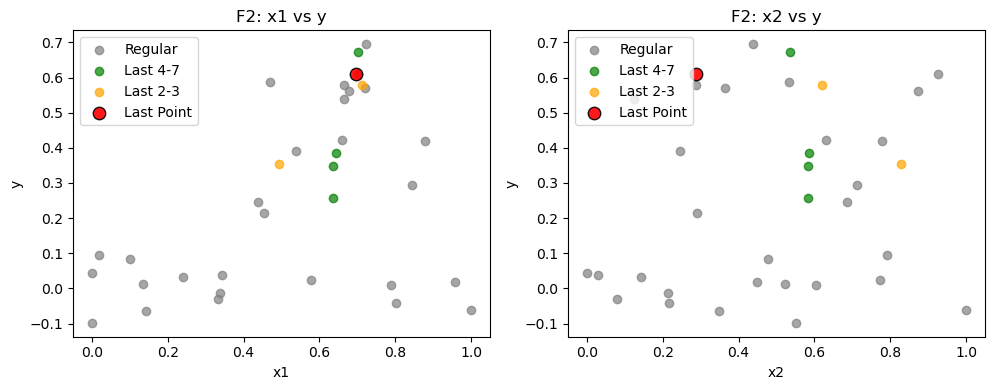

Generating plots for F3


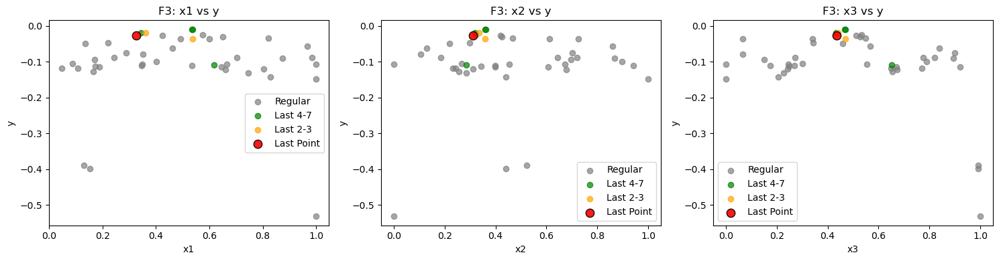

Generating plots for F4


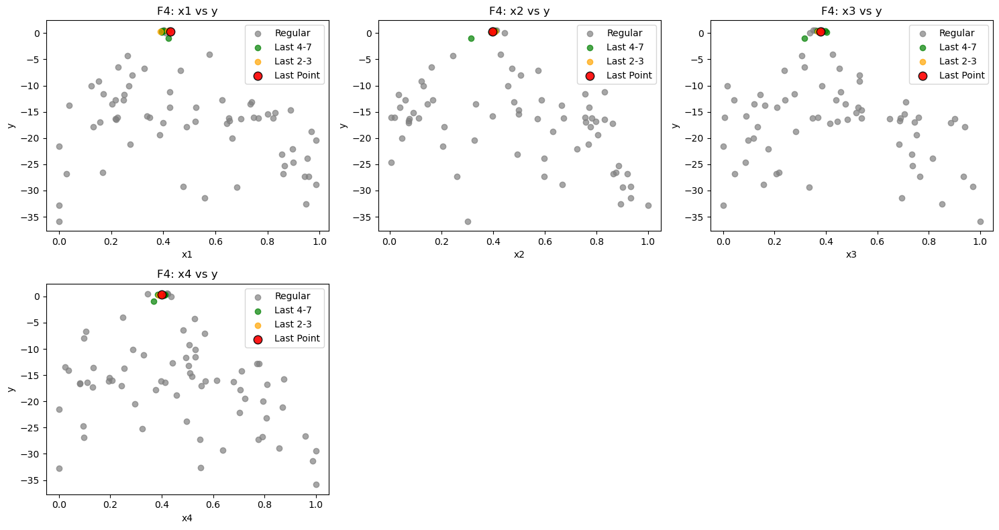

Generating plots for F5


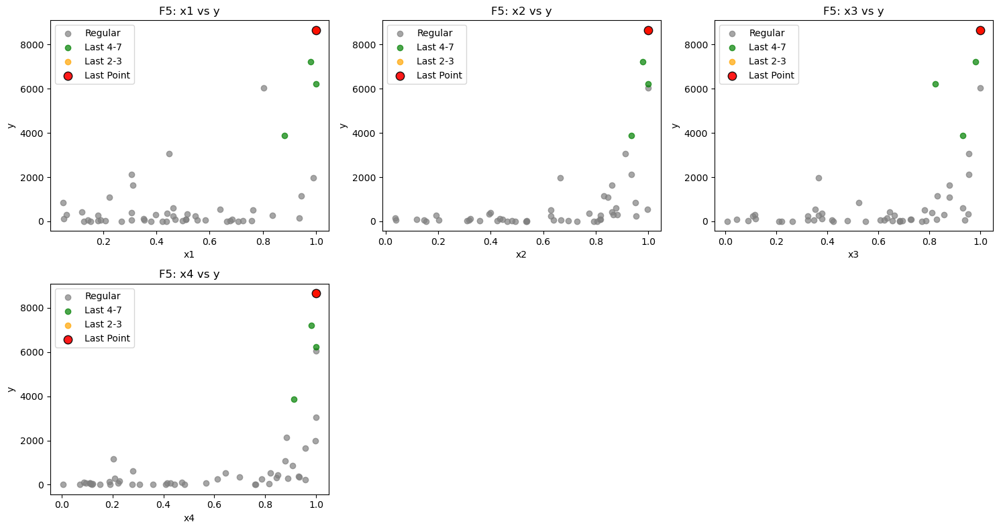

Generating plots for F6


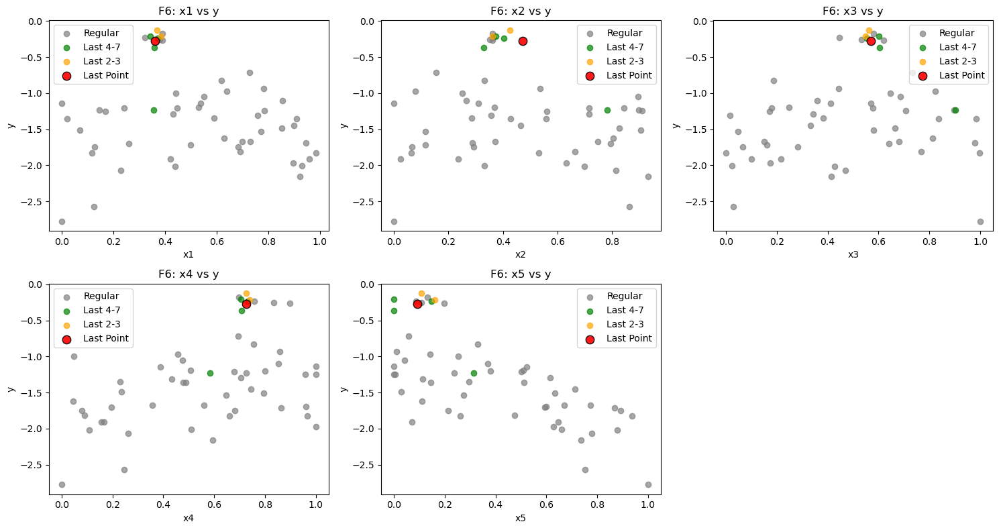

Generating plots for F7


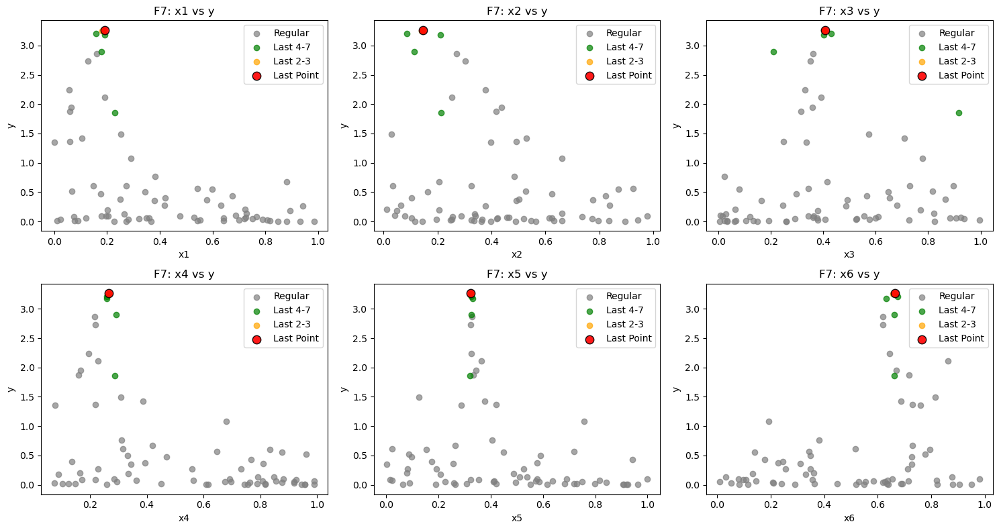

Generating plots for F8


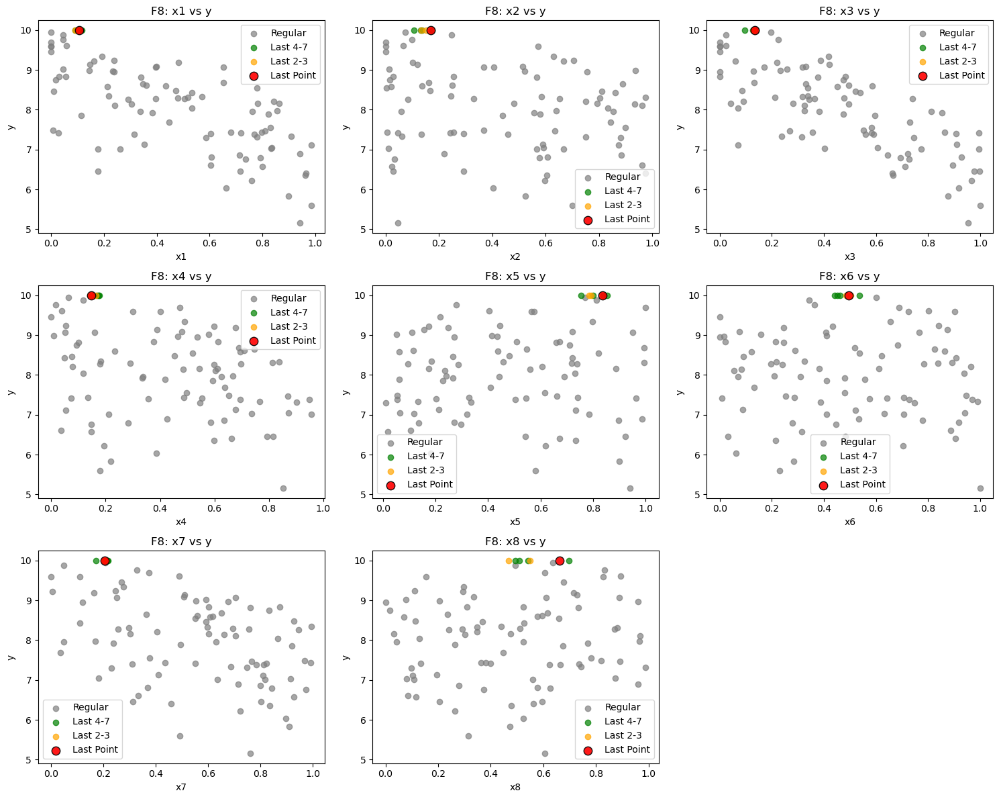

In [24]:
for key in x_all_dict.keys():
    x_data = x_all_dict[key]
    y_data = y_all_dict[key.replace("x_all", "y_all")]  
    title_prefix = key.replace("_x_all", "")  
    print(f"Generating plots for {title_prefix}")
    plot_features_vs_target(x_data, y_data, title_prefix=title_prefix)

**Create generic acquisition functions**

In [166]:
def acquisition_function_F1(X, y_sample, X_sample, model, beta=5):
    """
    Upper Confidence Bound (UCB)
    UCB will encourage exploration.
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)
    return mu + beta * sigma  # Higher beta = more exploration

In [168]:
def acquisition_function_F2(X, y_sample, X_sample, model, xi=0):
    """
    Expected Improvement (EI)
    Removed xi to prioritise exploit
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)
    #sigma = np.maximum(sigma, 1e-6)

    # Expected Improvement (EI) calculation
    y_best = np.max(y_sample)
    improvement = mu - y_best
    Z = improvement / (sigma + 1e-9)  # Prevent division by zero
    return improvement * norm.cdf(Z) + sigma * norm.pdf(Z)


In [132]:
def acquisition_function_F2_old(X, y_sample, X_sample, model, beta=3.5):
    """
    Upper Confidence Bound (UCB)
    UCB will encourage exploration.
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)
    return mu + beta * sigma  # Higher beta = more exploration

In [192]:
def acquisition_function_F3(X, y_sample, X_sample, model, kappa=0.1):
    """
    Upper Confidence
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)

    return mu + kappa * sigma

In [186]:
def acquisition_function_F4(X, y_sample, X_sample, model, beta=0.5):
    """
    Upper Confidence Bound (UCB)
    UCB will encourage exploration.
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)
    return mu + beta * sigma  # Higher beta = more exploration

In [140]:
def acquisition_function_F4_old(X, y_sample,X_sample, model, xi=0):
    """
    Expected Improvement (EI) with fixed xi.
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)

    # Expected Improvement (EI) calculation
    y_best = np.max(y_sample)
    improvement = mu - y_best - xi
    Z = improvement / (sigma + 1e-9)  # Prevent division by zero
    return improvement * norm.cdf(Z) + sigma * norm.pdf(Z)


In [142]:
from scipy.stats import norm
from scipy.spatial.distance import cdist
import numpy as np

def acquisition_function_F5(X, y_sample,  X_sample, model, xi=0, radius=1e-6):
    """
    Probability of Improvement (PI) Acquisition Function with hard-masking
    to avoid re-suggesting already-sampled points (e.g., 0.999999... corner).
    
    Parameters:
    - X: Candidate points (N x D)
    - y_sample: Observed outputs
    - model: Trained GP model
    - X_sampled: Previously sampled points
    - xi: Exploration parameter
    - radius: Distance threshold to mask points near already sampled ones
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)
    sigma = np.maximum(sigma, 1e-10)
    y_best = np.max(y_sample)

    # Compute Probability of Improvement
    z = (mu - y_best - xi) / sigma
    pi = norm.cdf(z)

    # Hard-mask previously sampled points (or close duplicates)
    dists = cdist(X, X_sample)
    min_dists = np.min(dists, axis=1)
    pi[min_dists < radius] = 0.0  # Prevent resampling

    return pi


In [144]:
def acquisition_function_F6(X, y_sample, X_sample, model, xi=0):
    """
    Expected Improvement (EI) with fixed xi.
    - Encourages improvement over best observed value.
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)

    # Expected Improvement (EI) calculation
    y_best = np.max(y_sample)
    improvement = mu - y_best - xi
    Z = improvement / (sigma + 1e-9)  # Prevent division by zero
    return improvement * norm.cdf(Z) + sigma * norm.pdf(Z)

In [146]:
def acquisition_function_F7(X, y_sample, X_sample, model, beta=0.1):
    """
    Upper Confidence Bound (UCB)
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)
    return mu + beta * sigma  # Higher beta = more exploration

In [148]:
def acquisition_function_F8(X, y_sample, X_sample, model, beta=0.1):
    """
    Upper Confidence Bound (UCB)
    """
    X = np.atleast_2d(X)
    mu, sigma = model.predict(X, return_std=True)
    return mu + beta * sigma  # Higher beta = more exploration

**Choosing the next point**

Looking at aquistion functions plots and grid search shows we need to be careful how this is optimsied.

In [37]:
import numpy as np
from scipy.optimize import minimize
from scipy.stats.qmc import Sobol
from joblib import Parallel, delayed
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

def propose_next_point(acquisition, y_sample, X_sample, model, bounds, grid_res=None, n_sobol=None, top_k=None, margin=None, n_jobs=-1):
    n_dims = len(bounds)

    # **Step 1: Adjust Grid Resolution for Faster Search**
    if grid_res is None:
        if n_dims == 1: grid_res = 50  # Increased from 35
        elif n_dims == 2: grid_res = 35  # Increased from 30
        elif n_dims == 3: grid_res = 25  # Increased from 20
        elif n_dims == 4: grid_res = 20  # Increased from 15
        else: grid_res = None  # No grid for 5D+

    # **Step 2: Adjust Sobol Sampling with stratified approach**
    if n_sobol is None:
        if n_dims <= 2: n_sobol = 800  # Increased further
        elif n_dims <= 4: n_sobol = 750
        elif n_dims <= 6: n_sobol = 600
        else: n_sobol = 500

    # **Step 3: Adjust Top-K Selection**
    if top_k is None:
        if n_dims <= 4: top_k = 20  # Increased further
        elif n_dims <= 6: top_k = 15
        else: top_k = 10

    # **Step 4: Adaptive margin based on dimensionality**
    if margin is None:
        margin = 0.02  # Reduced to sample closer to boundaries

    # **Step 5: Generate Grid Search Points (For ≤4D Only)**
    if grid_res:
        grid_axes = [np.linspace(bounds[d, 0], bounds[d, 1], grid_res) for d in range(n_dims)]
        grid_mesh = np.array(np.meshgrid(*grid_axes, indexing="ij"))
        grid_points = grid_mesh.reshape(n_dims, -1).T
    else:
        grid_points = np.empty((0, n_dims))

    # **Step 6: Multi-level Sobol Sampling**
    # First level: standard Sobol with smaller margin
    sobol_engine = Sobol(d=n_dims, scramble=True)
    sobol_samples_1 = sobol_engine.random(n_sobol // 2)
    lower_bound_1 = bounds[:, 0] + margin * (bounds[:, 1] - bounds[:, 0])
    upper_bound_1 = bounds[:, 1] - margin * (bounds[:, 1] - bounds[:, 0])
    sobol_points_1 = lower_bound_1 + sobol_samples_1 * (upper_bound_1 - lower_bound_1)
    
    # Second level: stratified sampling to ensure better coverage
    strata_count = min(5, int(np.ceil(np.power(n_sobol // 2, 1/n_dims))))
    strata_points = []
    
    # Create stratified samples across the space
    for d in range(n_dims):
        strata_edges = np.linspace(bounds[d, 0], bounds[d, 1], strata_count + 1)
        for i in range(strata_count):
            # Create a new Sobol sequence for each stratum
            stratum_sobol = Sobol(d=n_dims, scramble=True)
            stratum_samples = stratum_sobol.random(max(2, n_sobol // (2 * strata_count * n_dims)))
            
            # Adjust the samples to fall within this stratum for dimension d
            stratum_lower = bounds.copy()
            stratum_upper = bounds.copy()
            stratum_lower[d, 0] = strata_edges[i]
            stratum_upper[d, 1] = strata_edges[i+1]
            
            stratum_points = stratum_lower[:, 0] + stratum_samples * (stratum_upper[:, 1] - stratum_lower[:, 0])
            strata_points.append(stratum_points)
    
    # Combine all stratified points
    if strata_points:
        sobol_points_2 = np.vstack(strata_points)
        # Combine both Sobol approaches
        sobol_points = np.vstack([sobol_points_1, sobol_points_2])
    else:
        sobol_points = sobol_points_1

    # **Step 7: Parallel Acquisition Evaluation**
    def eval_acq(x):
        return acquisition(x, y_sample, X_sample, model)

    sobol_acq_values = np.array(Parallel(n_jobs=n_jobs)(delayed(eval_acq)(x) for x in sobol_points)).flatten()
    
    # Grid evaluation and best point selection
    if grid_res:
        grid_acq_values = np.array(Parallel(n_jobs=n_jobs)(delayed(eval_acq)(x) for x in grid_points)).flatten()
        
        # Select top grid points directly
        top_grid_count = min(max(10, grid_res // 2), len(grid_points))
        top_grid_indices = np.argsort(grid_acq_values)[-top_grid_count:]
        top_grid_points = grid_points[top_grid_indices]
        top_grid_acq = grid_acq_values[top_grid_indices]
        
        # Store the single best grid point
        grid_best_idx = np.argmax(grid_acq_values)
        grid_best_x = grid_points[grid_best_idx]
        grid_best_acq = grid_acq_values[grid_best_idx]
    else:
        grid_best_x = None
        grid_best_acq = -np.inf
        top_grid_points = np.empty((0, n_dims))
        top_grid_acq = np.empty((0,))

    # **Step 8: Combine all candidates and prioritize high-value regions**
    combined_points = np.vstack([sobol_points, top_grid_points]) if len(top_grid_points) > 0 else sobol_points
    combined_acq_values = np.concatenate([sobol_acq_values, top_grid_acq]) if len(top_grid_acq) > 0 else sobol_acq_values

    # **Step 9: Multi-modal identification via peak detection**
    # Sort points by acquisition value
    sorted_indices = np.argsort(combined_acq_values)[::-1]
    sorted_points = combined_points[sorted_indices]
    sorted_acq = combined_acq_values[sorted_indices]
    
    # Select top performer as first mode
    modes = [sorted_points[0]]
    mode_acq = [sorted_acq[0]]
    mode_threshold = np.mean(sorted_acq[:min(50, len(sorted_acq))]) * 0.7  # 70% of average top acquisition
    
    # Find additional modes that are far enough apart
    min_dist_threshold = 0.1 * np.sqrt(n_dims)  # Scale with dimensions
    
    for i in range(1, min(100, len(sorted_points))):
        # Check if point is above threshold
        if sorted_acq[i] < mode_threshold:
            break
            
        # Check distance to existing modes
        point = sorted_points[i]
        distances = [np.linalg.norm(point - mode) for mode in modes]
        
        if min(distances) > min_dist_threshold:
            modes.append(point)
            mode_acq.append(sorted_acq[i])
            
        # Stop after finding enough modes
        if len(modes) >= min(15, top_k):
            break
    
    # **Step 10: Select top candidates with emphasis on local modes**
    selected_candidates = np.array(modes)
    
    # Add remaining top performers if we haven't reached top_k
    remaining_slots = top_k - len(selected_candidates)
    if remaining_slots > 0:
        # Exclude points we've already selected
        mask = np.ones(len(sorted_points), dtype=bool)
        for mode in modes:
            # Find the index of this mode in sorted_points
            mode_idx = np.where(np.all(sorted_points == mode, axis=1))[0]
            if len(mode_idx) > 0:
                mask[mode_idx[0]] = False
                
        # Select additional top performers
        additional_candidates = sorted_points[mask][:remaining_slots]
        if len(additional_candidates) > 0:
            selected_candidates = np.vstack([selected_candidates, additional_candidates])
    
    # **Step 11: Advanced L-BFGS-B Optimization**
    best_x, best_value = None, -np.inf
    evaluated_points, evaluated_values = [], []

    def min_obj(X):
        value = -acquisition(X, y_sample,X_sample, model)
        evaluated_points.append(X.copy())
        evaluated_values.append(value)
        return value

    # Try a variety of optimization approaches from each starting point
    for x0 in selected_candidates:
        # Multiple optimization attempts with different perturbations
        for perturb_scale in [0.0, 0.05, 0.1]:
            perturb = np.random.uniform(-perturb_scale, perturb_scale, size=n_dims) * (bounds[:, 1] - bounds[:, 0])
            x0_perturbed = np.clip(x0 + perturb, bounds[:, 0], bounds[:, 1])
            
            # Different optimization parameters for different dimensions
            if n_dims <= 4:
                opts = {'maxiter': 75, 'ftol': 1e-6}
            else:
                opts = {'maxiter': 40, 'ftol': 1e-5}
            
            res = minimize(min_obj, x0=x0_perturbed.flatten(), bounds=bounds, 
                         method="L-BFGS-B", options=opts)
            
            if res.success and -res.fun > best_value:
                best_x, best_value = res.x, -res.fun
    
    # **Step 12: Direct search near the best grid point (if exists)**
    if grid_best_x is not None:
        # Fine grid search around the best grid point
        fine_margin = 0.05  # 5% of the range around the best grid point
        fine_res = 5  # 5^dims points around the best point
        
        for d in range(n_dims):
            grid_span = bounds[d, 1] - bounds[d, 0]
            fine_min = max(bounds[d, 0], grid_best_x[d] - fine_margin * grid_span)
            fine_max = min(bounds[d, 1], grid_best_x[d] + fine_margin * grid_span)
            
            if n_dims <= 3:  # Only do fine grid for low dimensions
                fine_grid_axes = [np.linspace(fine_min, fine_max, fine_res) for d in range(n_dims)]
                fine_grid_mesh = np.array(np.meshgrid(*fine_grid_axes, indexing="ij"))
                fine_grid_points = fine_grid_mesh.reshape(n_dims, -1).T
                
                fine_grid_acq = np.array([eval_acq(x) for x in fine_grid_points])
                fine_best_idx = np.argmax(fine_grid_acq)
                fine_best_x = fine_grid_points[fine_best_idx]
                fine_best_acq = fine_grid_acq[fine_best_idx]
                
                if fine_best_acq > best_value:
                    best_x, best_value = fine_best_x, fine_best_acq
    
    # **Step 13: Final direct comparison with grid best**
    if grid_best_x is not None:
        # Check if the grid's best is actually better than our optimization result
        if grid_best_acq > best_value:
            best_x, best_value = grid_best_x, grid_best_acq
            stopping_reason = "Grid search outperformed optimization"
        else:
            stopping_reason = "Optimized via Multi-modal search + L-BFGS-B"
    else:
        stopping_reason = "Optimized via Multi-modal search + L-BFGS-B"

    # **Step 14: Fallback if optimization fails**
    if best_x is None:
        # Find the best point from all evaluated candidates
        if evaluated_points and evaluated_values:
            best_idx = np.argmin(evaluated_values)
            best_x = evaluated_points[best_idx]
            best_value = -evaluated_values[best_idx]
            stopping_reason = "Fallback to evaluated point"
        else:
            # Last resort - just pick the best from combined points
            best_idx = np.argmax(combined_acq_values)
            best_x = combined_points[best_idx]
            best_value = combined_acq_values[best_idx]
            stopping_reason = "Fallback to best candidate"

    return best_x, np.array(evaluated_points), -np.array(evaluated_values), stopping_reason

**Tranformation to function 5**

In [39]:
print(y_all_dict["F5_y_all"])

[6.44434399e+01 1.83013796e+01 1.12939795e-01 4.21089813e+00
 2.58370525e+02 7.84343889e+01 5.75715369e+01 1.09571876e+02
 8.84799176e+00 2.33223610e+02 2.44230883e+01 6.44201468e+01
 6.34767158e+01 7.97291299e+01 3.55806818e+02 1.08885962e+03
 2.88667516e+01 4.51815703e+01 4.31612757e+02 9.97233189e+00
 1.16473297e+03 1.21188493e+02 2.87522281e+02 1.98066524e+03
 5.28521436e+02 6.59070325e+01 2.73993040e+02 3.34964253e+02
 3.03509422e+00 3.16811442e+02 2.13695298e+03 1.63923940e+01
 1.47198474e+01 7.44697895e+00 5.40487146e+02 1.52854400e+02
 1.03383108e+02 2.53166057e+02 3.59261876e+01 2.10925883e+00
 7.67234956e+01 1.65272444e+03 3.05208636e+03 1.14327406e+01
 6.14649156e+02 3.92210464e+02 8.52970628e+02 6.04520610e+03
 2.59331022e+03 3.87223941e+03 8.66240500e+03 7.22321475e+03
 6.23104492e+03 8.66238563e+03 8.66238563e+03 8.66238563e+03]


In [40]:
#Apply log scaling to try and get better modelling of peak location
y = y_all_dict["F5_y_all"]
y_log = np.log1p(y - np.min(y) + 1e-4)
print(y_log)

[4.17946053e+00 2.95431322e+00 9.99950003e-05 1.62885975e+00
 5.55782249e+00 4.37350983e+00 4.06832047e+00 4.70464474e+00
 2.27574325e+00 5.45579438e+00 3.23120939e+00 4.17910393e+00
 4.16455254e+00 4.38970074e+00 5.87687821e+00 6.99370063e+00
 3.39296061e+00 3.83013442e+00 6.06958213e+00 2.38503955e+00
 7.06100852e+00 4.80464096e+00 5.66438114e+00 7.59163586e+00
 6.27176053e+00 4.20161614e+00 5.61633537e+00 5.81666884e+00
 1.36666660e+00 5.76110314e+00 7.66755132e+00 2.84952397e+00
 2.74772002e+00 2.12036023e+00 6.29411092e+00 5.03527301e+00
 4.64698626e+00 5.53754376e+00 3.60586049e+00 1.09741792e+00
 4.35170473e+00 7.41071703e+00 8.02387132e+00 2.51121590e+00
 6.42249395e+00 5.97405799e+00 6.74976466e+00 8.70716760e+00
 7.86103245e+00 8.26181736e+00 9.06685009e+00 8.88517820e+00
 8.73744169e+00 9.06684785e+00 9.06684785e+00 9.06684785e+00]


In [41]:
y_all_dict["F5_y_all"]=y_log

**Apply log scaling to function 7 to capture peaks better - KEEP**

In [43]:
#print(y_all_dict["F7_y_all"])

In [44]:
y = y_all_dict["F7_y_all"]
y_log = np.log1p(y - np.min(y) + 1e-4)
#print(y_log)

In [45]:
y_all_dict["F7_y_all"]=y_log

**Define which functions to scale**

In [47]:
functions_to_scale = ["F4", "F8"] # proven previously to be better
y_all_scaled_dict = {}

for key in y_all_dict.keys():
    y_data = y_all_dict[key]
    function_name = key.split("_")[0]  # Extract the function identifier (e.g., "F4")
    if function_name in functions_to_scale:
        y_scaler = StandardScaler()
        y_scaled = y_scaler.fit_transform(y_data.reshape(-1, 1)).ravel()
        y_all_scaled_dict[key] = y_scaled  # Store the scaled data
    else:
        y_all_scaled_dict[key] = y_data

**More specific GP optimisation**

In [49]:
function_specific_gps = {
    
    # Function 1: 2D - Contamination Sources (Difficult, multimodal)
    "Function 1": GaussianProcessRegressor(
        kernel = ConstantKernel(1.0, constant_value_bounds=(1e-2, 1e2)) * (
            Matern(length_scale=[1.0, 1.0], nu=1.5, length_scale_bounds=(1e-2, 1.0)) +
            RationalQuadratic(length_scale=1.0, alpha=1.0,
                              length_scale_bounds=(1e-2, 1.0),
                              alpha_bounds=(1e-2, 1e2))
        ) + WhiteKernel(noise_level=1e-2, noise_level_bounds=(1e-5, 1e-1))
        ,
    
        alpha=1e-6,  
        optimizer="fmin_l_bfgs_b",
        #normalize_y=True,
        n_restarts_optimizer=25,  
    ),

    # Function 2: 2D - Optimizing Noisy ML Model (High noise, local optima)
    "Function 2": GaussianProcessRegressor(
        kernel = ConstantKernel(1.0, (0.1, 10.0)) * (
            Matern(length_scale=[0.2, 0.2], nu=1.5, length_scale_bounds=(1e-2, 1.0)) +
            RationalQuadratic(length_scale=0.2, alpha=1.0) +
            RBF(length_scale=0.3)
        ) + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-5, 1e-1)),
        alpha=1e-6,  # Higher alpha to handle noise
        n_restarts_optimizer=25  # Slightly more restarts to avoid local optima
    ),

    # Function 3: 3D - Drug Discovery (Close to Zero, Some Variables Irrelevant)
    "Function 3": GaussianProcessRegressor(
        kernel=(
            1.0 * RationalQuadratic(length_scale=0.3, alpha=0.8) + WhiteKernel(noise_level=5e-5)
        ),
        alpha=5e-5,
        n_restarts_optimizer=15
    ),  

    # Function 4: 4D - Fast but Inaccurate Model (Local optima, dynamical system)
    "Function 4": GaussianProcessRegressor(
        kernel = (
        1.0 * RationalQuadratic(length_scale=0.3, alpha=1.2) 
        + 0.5 * Matern(length_scale=0.5, nu=1.5)
        + WhiteKernel(noise_level=0.001)
    ),
        alpha=0.001,
        n_restarts_optimizer=20  # More restarts for robustness
    ),  

    # Function 5: 4D - Chemical Yield Optimization (Likely Unimodal)
    "Function 5": GaussianProcessRegressor(
        kernel = ConstantKernel(1.0, constant_value_bounds=(1e-2, 1e2)) * (
        Matern(length_scale=[0.2]*4, nu=1.5,
               length_scale_bounds=(1e-2, 1.0)) +
        RationalQuadratic(length_scale=0.2, alpha=0.5,
                          length_scale_bounds=(1e-2, 1.0),
                          alpha_bounds=(1e-2, 1e2))
    ) + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-5, 1e-1)),  
        alpha=1e-5,
        #normalize_y=True,
        n_restarts_optimizer=50,  
    ),

    # Function 6: 5D - Cake Recipe Optimization (Multi-Objective, Balanced)
    "Function 6": GaussianProcessRegressor(
        kernel = ConstantKernel(1.0, (0.1, 10.0)) * (
            Matern(length_scale=[0.2]*5, nu=1.5, length_scale_bounds=(1e-2, 1.0)) +
            RationalQuadratic(length_scale=0.3, alpha=0.5) +
            RBF(length_scale=0.3)
        ) + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-5, 1e-1)),
        alpha=1e-6,
        normalize_y=True,
        n_restarts_optimizer=30
    ),  

    # Function 7: 6D - ML Hyperparameter Tuning (Complex, existing research available)
    "Function 7": GaussianProcessRegressor(
        kernel = ConstantKernel(1.0, (0.1, 10.0)) * (
            Matern(length_scale=[0.2]*6, nu=1.5, length_scale_bounds=(1e-2, 1.0)) +
            RationalQuadratic(length_scale=0.3, alpha=0.5) +
            RBF(length_scale=0.3)
        ) + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-5, 1e-1)),  
        normalize_y=True,  
        alpha=1e-6,  
        n_restarts_optimizer=50,  
    ),

    # Function 8: 8D - High-Dimensional Maximization (Difficult, Local Optimization)
   "Function 8": GaussianProcessRegressor(
        kernel=(
            1.0 * RationalQuadratic(length_scale=0.8, alpha=1.5) + WhiteKernel(noise_level=1e-4)
        ),
        alpha=1e-4,
        n_restarts_optimizer=10  # Fewer restarts for efficiency
    )  
}


**Define GP'**

In [51]:
import numpy as np
import warnings
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

def optimize_gp_cv_specific(acquisition_function, bounds, X_sample, y_sample, function_name, n_splits=10):
    """
    Optimizes a Gaussian Process model using cross-validation and retrains the best model on full data.

    Parameters:
        acquisition_function: Function to evaluate acquisition values.
        bounds (array-like): Bounds for the parameters.
        X_sample (ndarray): Sampled input data.
        y_sample (ndarray): Corresponding observed outputs.
        function_name (str): Name of the function being optimized.
        n_splits (int): Number of cross-validation splits.

    Returns:
        dict: Best model parameters, LML, MSE, next evaluation point, and retrained GP model.
    """
    warnings.simplefilter("ignore", category=UserWarning)

    # Ensure function exists in GP dictionary
    if function_name not in function_specific_gps:
        raise ValueError(f"Function {function_name} is not recognized.")

    # Select the GP model specific to the function
    gp = function_specific_gps[function_name]

    best_lml = -np.inf
    best_fold_mse = None
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    lml_scores = []
    fold_mse_scores = []

    alpha_fixed = gp.alpha  # Always use fixed alpha

    for train_idx, val_idx in kf.split(X_sample):
        X_train, X_val = X_sample[train_idx], X_sample[val_idx]
        y_train, y_val = y_sample[train_idx], y_sample[val_idx]

        alpha_train = np.full(len(y_train), alpha_fixed)

        gp_cv = GaussianProcessRegressor(
            kernel=gp.kernel,
            alpha=alpha_train,
            optimizer="fmin_l_bfgs_b",
            n_restarts_optimizer=30,
        )

        gp_cv.fit(X_train, y_train)
        y_val_pred = gp_cv.predict(X_val)

        fold_mse_scores.append(mean_squared_error(y_val, y_val_pred))
        lml_scores.append(gp_cv.log_marginal_likelihood_value_)

    avg_lml = np.mean(lml_scores)
    avg_fold_mse = np.mean(fold_mse_scores)

    alpha_full = alpha_fixed

    gp_final = GaussianProcessRegressor(
        kernel=gp.kernel,
        alpha=alpha_full,
        optimizer="fmin_l_bfgs_b",
        n_restarts_optimizer=30,
    )

    gp_final.fit(X_sample, y_sample)

    X_next, evaluated_points, evaluated_values, stopping_reason = propose_next_point(
        acquisition_function, y_sample, X_sample, gp_final, bounds
    )

    results = {
        "best_lml": avg_lml,
        "mse": avg_fold_mse,
        "X_next": X_next,
        "evaluated_points": evaluated_points,
        "evaluated_values": evaluated_values,
        "stopping_reason": stopping_reason,
        "best_gp": gp_final,
        "acquisition_function": acquisition_function,
        "X_sample": X_sample,
        "y_sample": y_sample
    }
    return results


In [194]:
# Define acquisition functions for each function
acquisition_functions = {
    "Function 1": acquisition_function_F1,
    "Function 2": acquisition_function_F2,
    "Function 3": acquisition_function_F3,
    "Function 4": acquisition_function_F4,
    "Function 5": acquisition_function_F5,
    "Function 6": acquisition_function_F6,
    "Function 7": acquisition_function_F7,
    "Function 8": acquisition_function_F8,
}

# Define the number of dimensions for each function
dimensions = {
    "Function 1": 2,
    "Function 2": 2,
    "Function 3": 3,
    "Function 4": 4,
    "Function 5": 4,
    "Function 6": 5,
    "Function 7": 6,
    "Function 8": 8,
}

# Create bounds_dict dynamically
bounds_dict = {
    func_name: np.array([[0.000001, 0.999999]] * dim)  # Repeat the bounds for each dimension
    for func_name, dim in dimensions.items()
}
        
# Dictionary to store results for each function
results_final_GP = {}
# Run optimization for each function
for func_name, acquisition_function in acquisition_functions.items():
    print(f"Running optimization for {func_name}...")
    func_number = func_name.split()[1]  # Extract the function number (e.g., "1" from "Function 1")
    x_key = f"F{func_number}_x_all"  
    y_key = f"F{func_number}_y_all"  
    X_sample = x_all_dict[x_key]
    y_sample = y_all_scaled_dict[y_key]
    bounds = bounds_dict[func_name]
    
    result = optimize_gp_cv_specific(
        acquisition_function=acquisition_function,
        bounds=bounds,
        X_sample=X_sample,
        y_sample=y_sample,
        function_name=func_name,
        n_splits=5  #cross-validation splits
    )
    results_final_GP[func_name] = result

Running optimization for Function 1...
Running optimization for Function 2...
Running optimization for Function 3...
Running optimization for Function 4...
Running optimization for Function 5...
Running optimization for Function 6...
Running optimization for Function 7...
Running optimization for Function 8...


In [196]:
for func_name, result in results_final_GP.items():
    best_params = result.get('best_params', None)
    best_lml = result.get('best_lml', None)
    mse = result.get('mse', None)
    X_next = result.get('X_next', None)
    Acquisition_stopping_reason = result.get('stopping_reason', None)

    # Format X_next if it exists
    if X_next is not None:
        X_next_formatted = "-".join(f"{x:.6f}" for x in X_next)
    else:
        X_next_formatted = "N/A"
    
    print(f"Function: {func_name}")
    print(f"  Best Parameters: {best_params}")
    print(f"  Best Log Marginal Likelihood (LML): {best_lml}")
    print(f"  Mean Squared Error (MSE): {mse}")
    print(f"  Suggested Next Point (X_next): {X_next_formatted}")
    print(f"  Acquisition stopping reason: {Acquisition_stopping_reason}")
    print("-" * 50)  # Separator for readability

Function: Function 1
  Best Parameters: None
  Best Log Marginal Likelihood (LML): 66.42971754749026
  Mean Squared Error (MSE): 0.0004479501146865291
  Suggested Next Point (X_next): 0.604323-0.611921
  Acquisition stopping reason: Optimized via Multi-modal search + L-BFGS-B
--------------------------------------------------
Function: Function 2
  Best Parameters: None
  Best Log Marginal Likelihood (LML): 9.94276746957433
  Mean Squared Error (MSE): 0.015638841547256328
  Suggested Next Point (X_next): 0.695432-0.452127
  Acquisition stopping reason: Optimized via Multi-modal search + L-BFGS-B
--------------------------------------------------
Function: Function 3
  Best Parameters: None
  Best Log Marginal Likelihood (LML): 49.39568101099444
  Mean Squared Error (MSE): 0.006984346074033714
  Suggested Next Point (X_next): 0.387283-0.384895-0.443704
  Acquisition stopping reason: Optimized via Multi-modal search + L-BFGS-B
--------------------------------------------------
Function: 

**check suggested point hasn't been sampled already**

In [198]:
def is_duplicate(new_point, existing_points, eps=1e-8):
    """
    Check whether the new_point is already in existing_points.
    
    Parameters:
        new_point (np.ndarray): Shape (d,) or (1, d)
        existing_points (np.ndarray): Shape (n_samples, d)
        eps (float): Tolerance for float comparison.
    
    Returns:
        bool: True if duplicate exists, False otherwise.
    """
    if new_point.ndim == 1:
        new_point = new_point.reshape(1, -1)
    return np.any(np.all(np.abs(existing_points - new_point) < eps, axis=1))


In [200]:
for func_name in results_final_GP:
    func_number = func_name.split()[1]
    x_key = f"F{func_number}_x_all"
    X_sample = x_all_dict[x_key]

    result = results_final_GP[func_name]
    X_next = result.get("X_next")

    if X_next is not None:
        duplicate_status = is_duplicate(X_next, X_sample)
        result["is_duplicate"] = duplicate_status
        if duplicate_status:
            print(f"⚠️ {func_name}: Suggested point is a duplicate.")
        else:
            print(f"✅ {func_name}: Suggested point is unique.")
    else:
        result["is_duplicate"] = None
        print(f"⚠️ {func_name}: No x_next found in result.")


✅ Function 1: Suggested point is unique.
✅ Function 2: Suggested point is unique.
✅ Function 3: Suggested point is unique.
✅ Function 4: Suggested point is unique.
✅ Function 5: Suggested point is unique.
✅ Function 6: Suggested point is unique.
✅ Function 7: Suggested point is unique.
✅ Function 8: Suggested point is unique.


**Check number of aquistion evaluations**

In [203]:
# Dictionary to store the number of evaluated y values for each function
evaluated_y_counts = {}

# Iterate through each function's results
for func_name, result in results_final_GP.items():
    evaluated_values = result.get("evaluated_values", None)  # Get evaluated y values
    
    # Count the number of evaluated y values
    num_evaluations = len(evaluated_values) if evaluated_values is not None else 0
    evaluated_y_counts[func_name] = num_evaluations

# Display the results
for func_name, count in evaluated_y_counts.items():
    print(f"{func_name}: {count} acquisition evaluations")
    #print(f"{func_name}: evaluated points" , evaluated_points)
    #print(f"{func_name}: evaluated values" , evaluated_values)

Function 1: 1725 acquisition evaluations
Function 2: 1866 acquisition evaluations
Function 3: 2208 acquisition evaluations
Function 4: 2375 acquisition evaluations
Function 5: 12410 acquisition evaluations
Function 6: 2904 acquisition evaluations
Function 7: 3717 acquisition evaluations
Function 8: 6525 acquisition evaluations


**Visualise aquisition function space**

Visualizing Acquisition Function for Function 1...
Plotting pair (X1, X2) for Function 1...


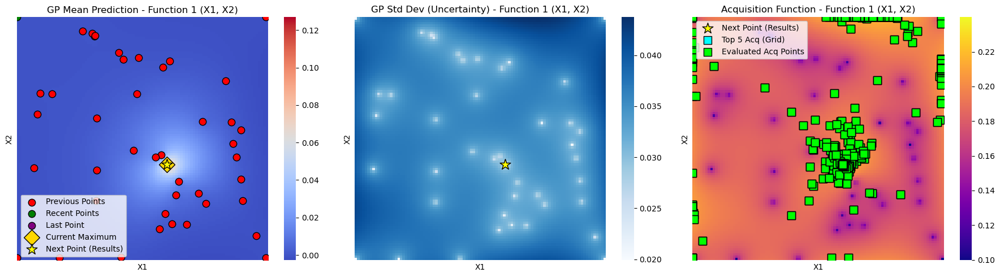

Visualizing Acquisition Function for Function 2...
Plotting pair (X1, X2) for Function 2...


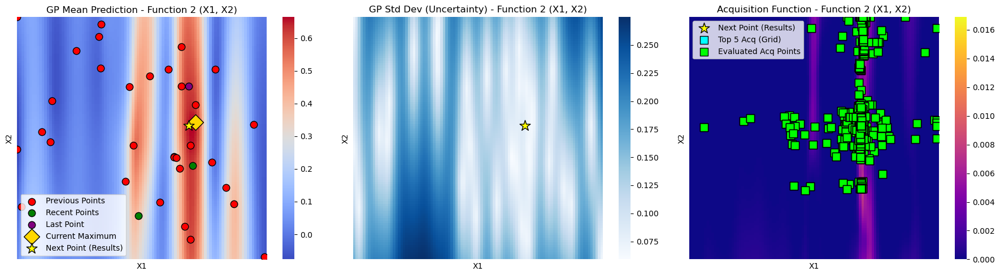

Visualizing Acquisition Function for Function 3...
Plotting pair (X1, X2) for Function 3...


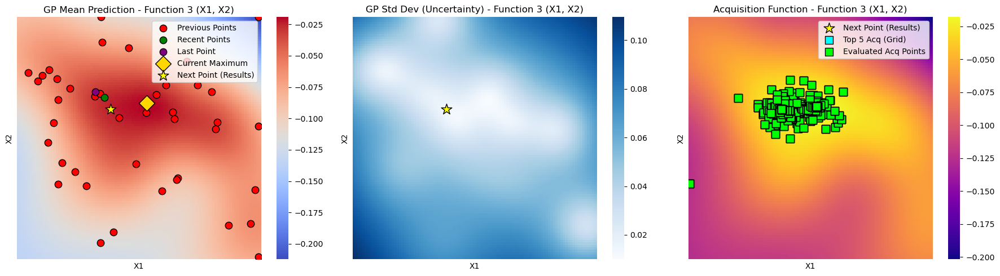

Plotting pair (X1, X3) for Function 3...


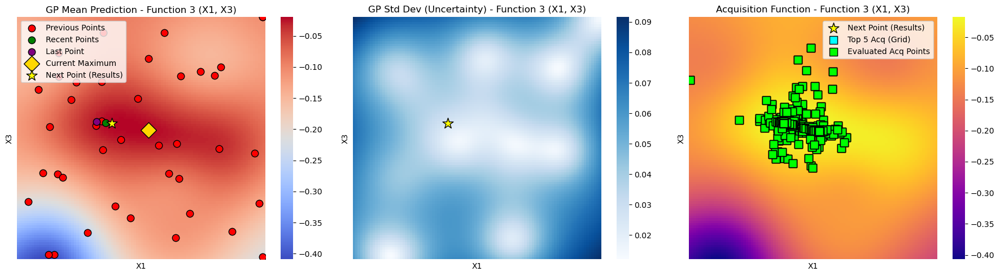

Plotting pair (X2, X3) for Function 3...


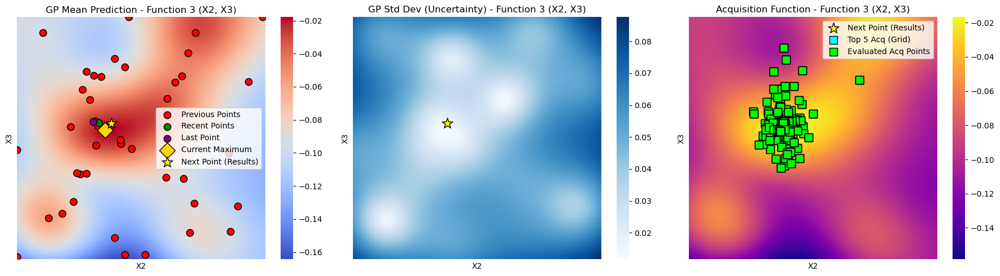

Visualizing Acquisition Function for Function 4...
Plotting pair (X1, X2) for Function 4...


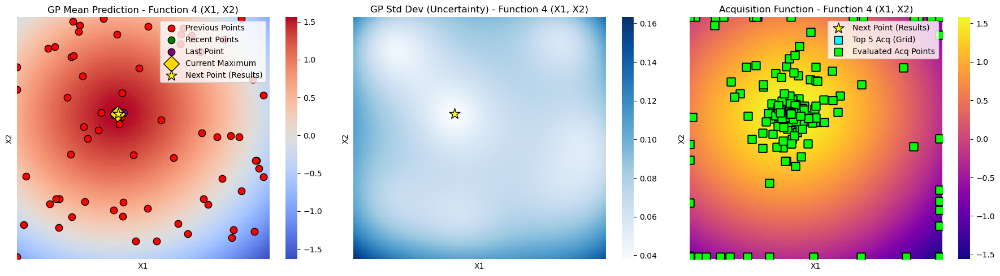

Plotting pair (X1, X3) for Function 4...


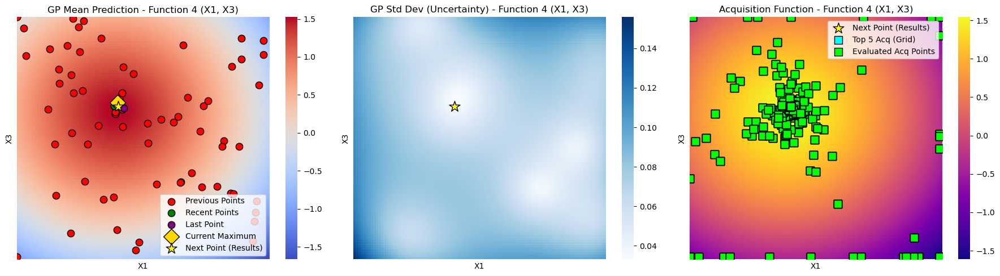

Plotting pair (X1, X4) for Function 4...


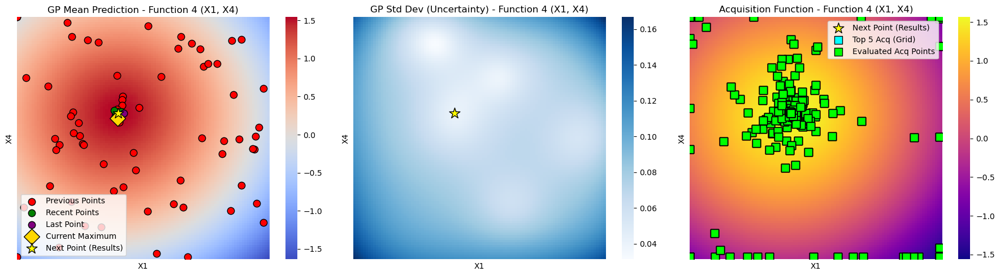

Plotting pair (X2, X3) for Function 4...


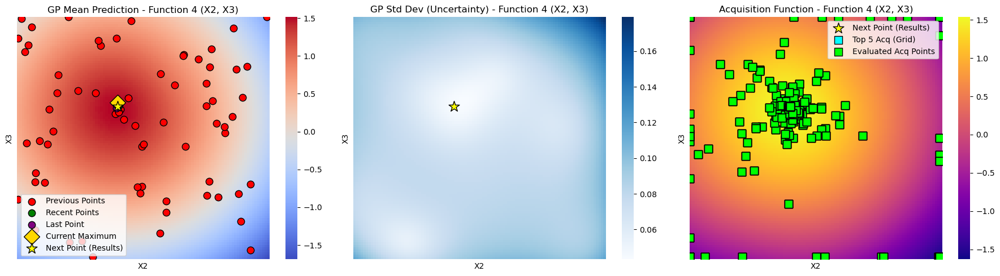

Plotting pair (X2, X4) for Function 4...


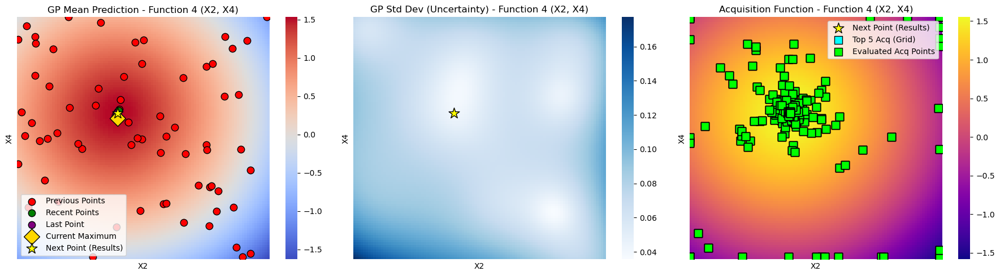

Plotting pair (X3, X4) for Function 4...


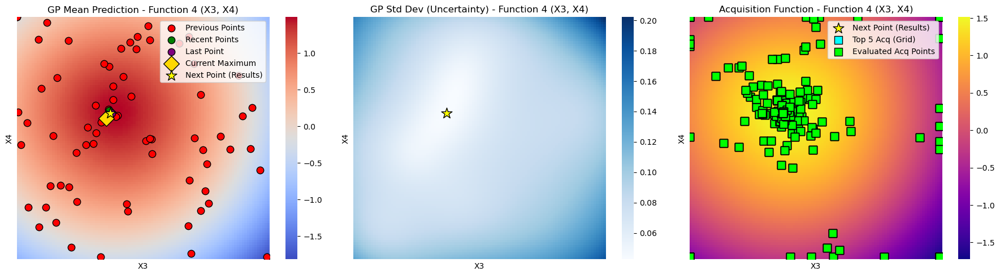

Visualizing Acquisition Function for Function 5...
Plotting pair (X1, X2) for Function 5...


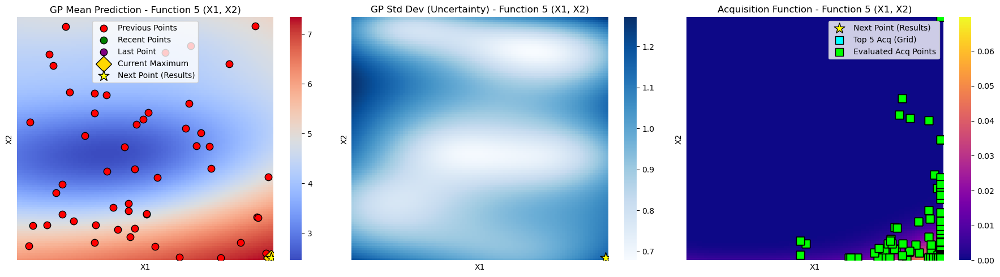

Plotting pair (X1, X3) for Function 5...


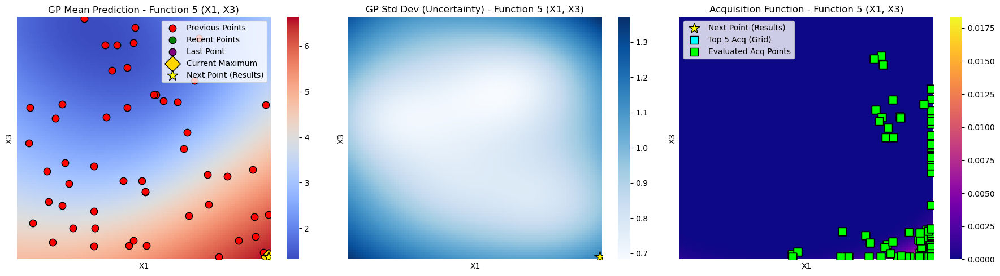

Plotting pair (X1, X4) for Function 5...


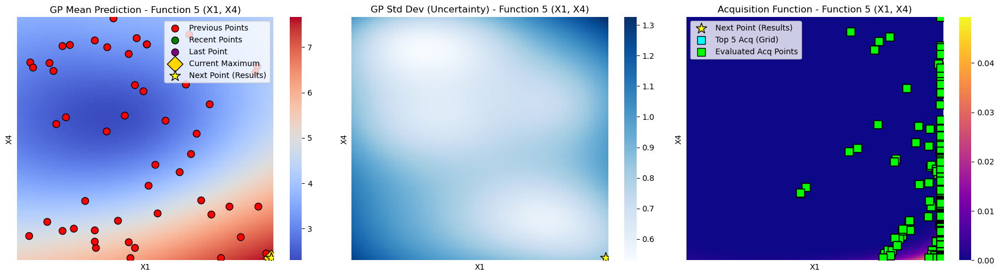

Plotting pair (X2, X3) for Function 5...


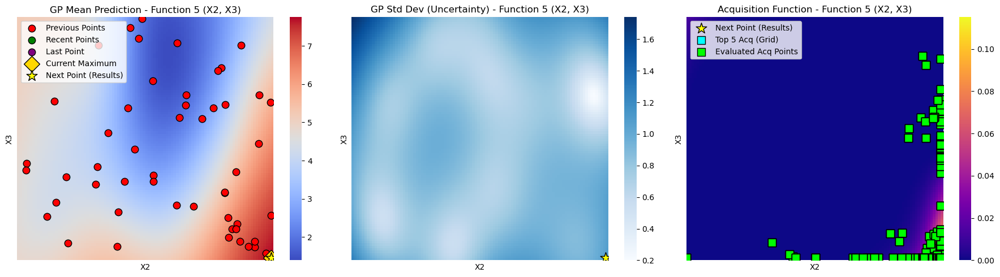

Plotting pair (X2, X4) for Function 5...


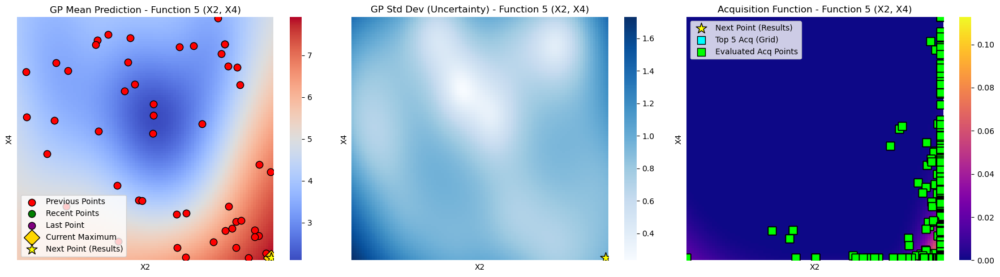

Plotting pair (X3, X4) for Function 5...


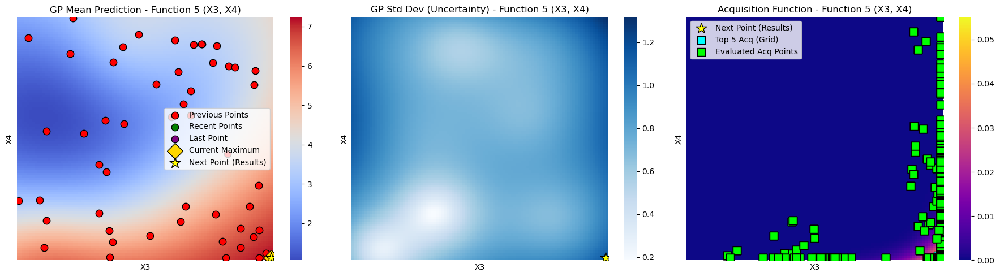

Visualizing Acquisition Function for Function 6...
Plotting pair (X1, X2) for Function 6...


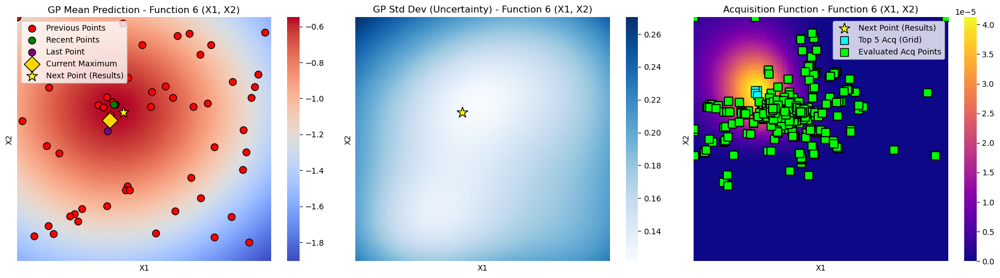

Plotting pair (X1, X3) for Function 6...


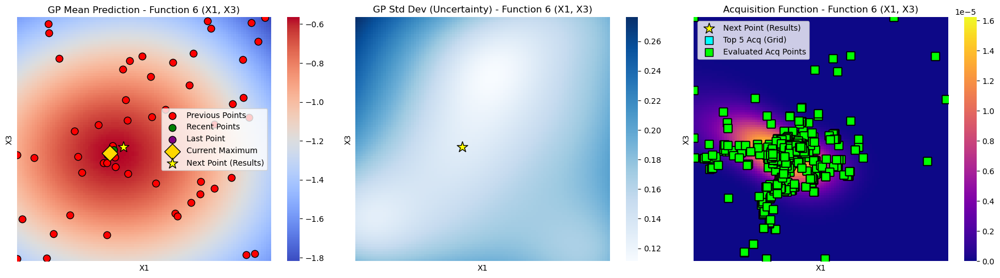

Plotting pair (X1, X4) for Function 6...


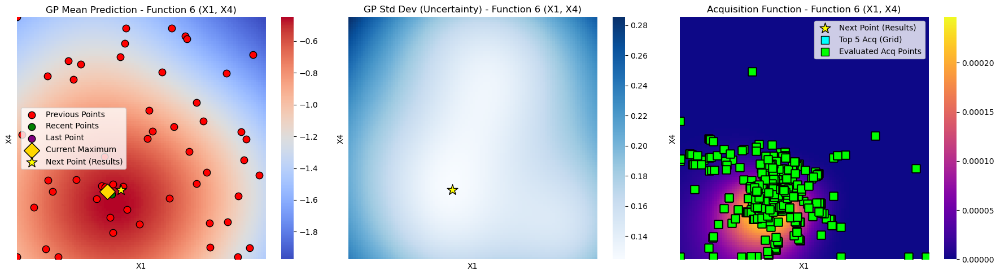

Plotting pair (X1, X5) for Function 6...


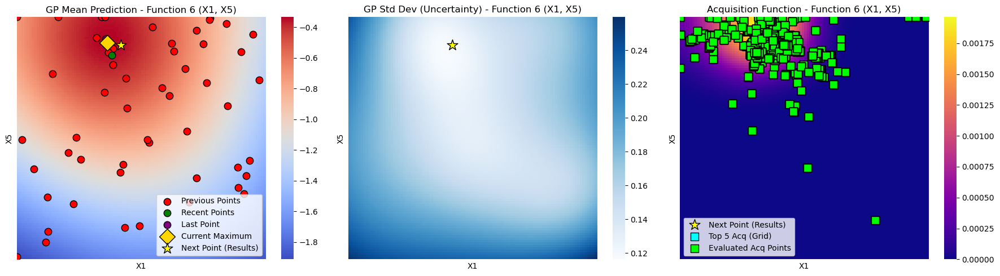

Plotting pair (X2, X3) for Function 6...


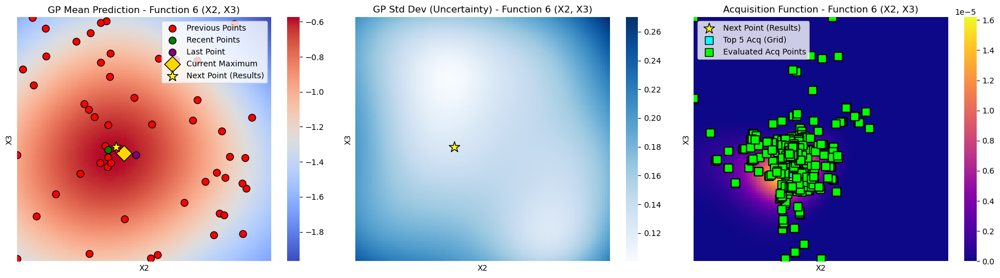

Plotting pair (X2, X4) for Function 6...


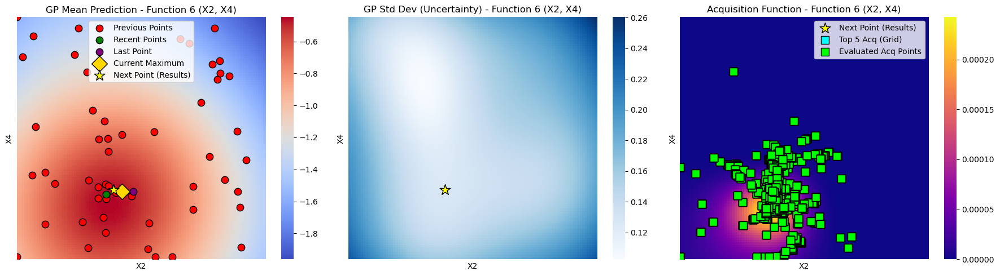

Plotting pair (X2, X5) for Function 6...


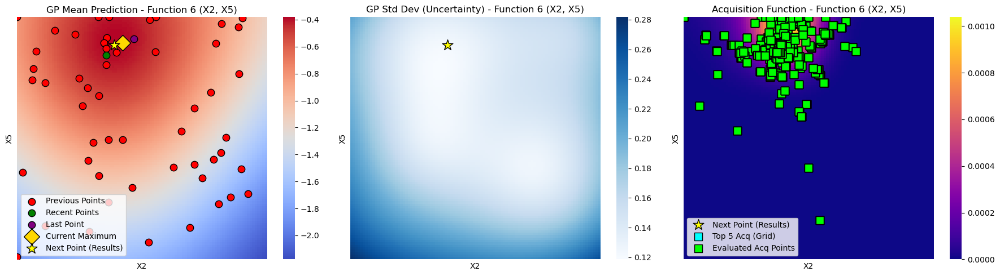

Plotting pair (X3, X4) for Function 6...


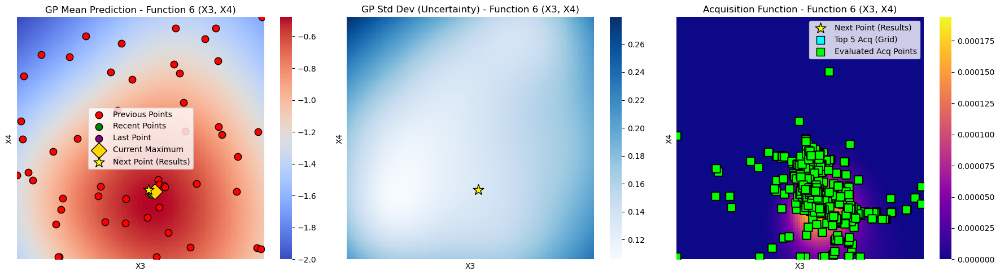

Plotting pair (X3, X5) for Function 6...


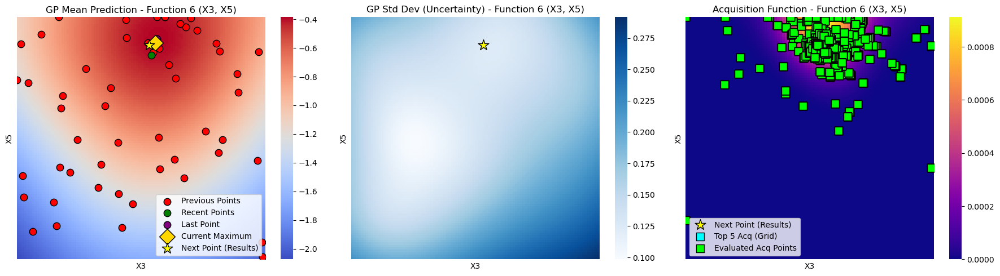

Plotting pair (X4, X5) for Function 6...


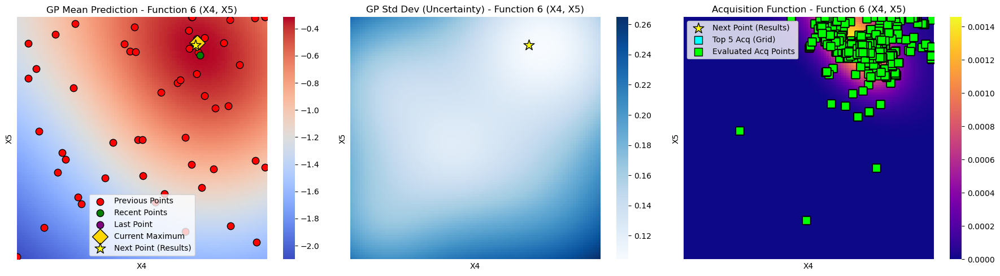

Visualizing Acquisition Function for Function 7...
Plotting pair (X1, X2) for Function 7...


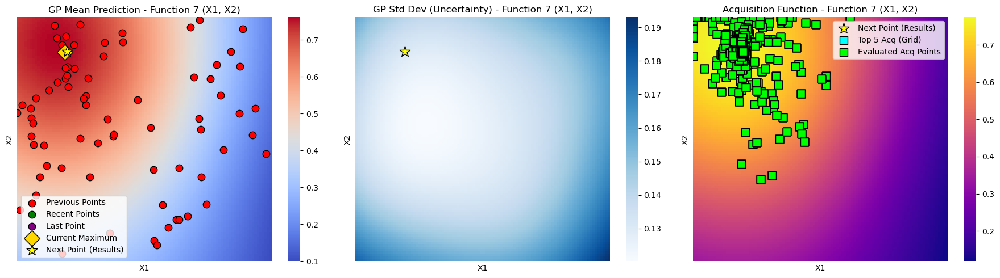

Plotting pair (X1, X3) for Function 7...


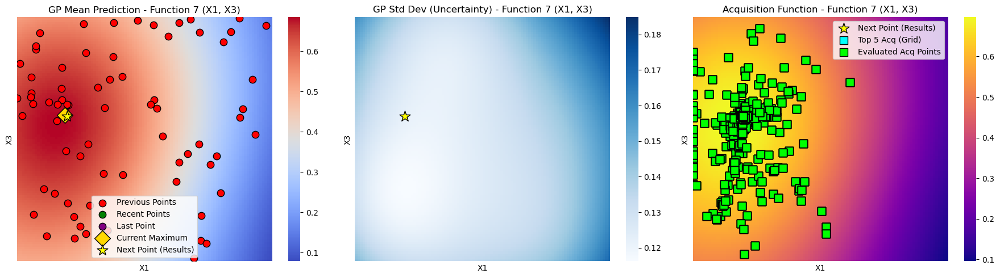

Plotting pair (X1, X4) for Function 7...


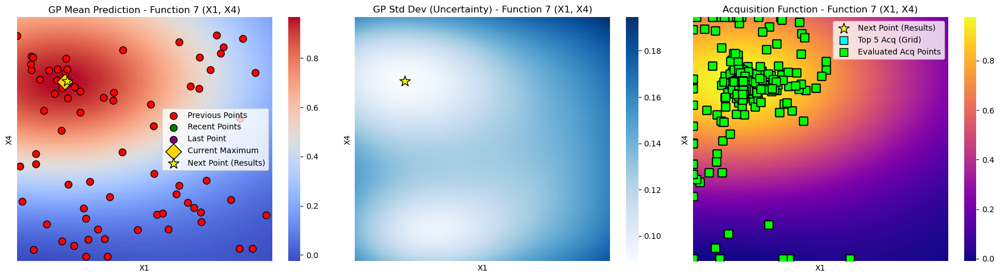

Plotting pair (X1, X5) for Function 7...


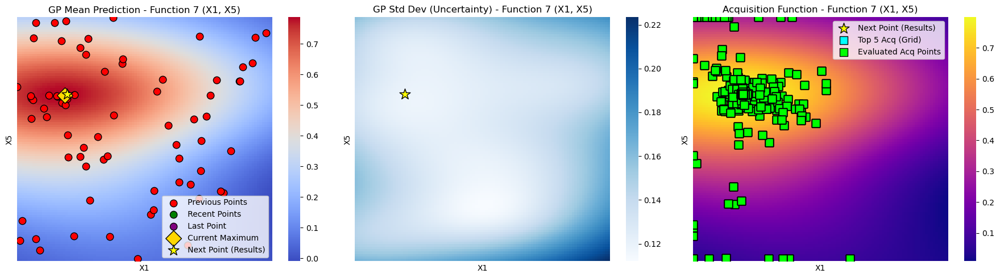

Plotting pair (X1, X6) for Function 7...


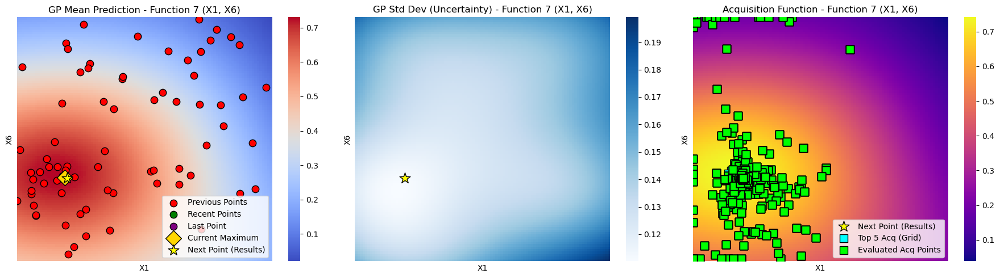

Plotting pair (X2, X3) for Function 7...


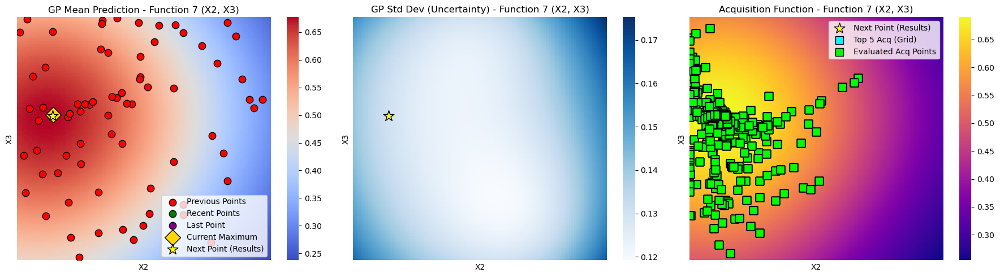

Plotting pair (X2, X4) for Function 7...


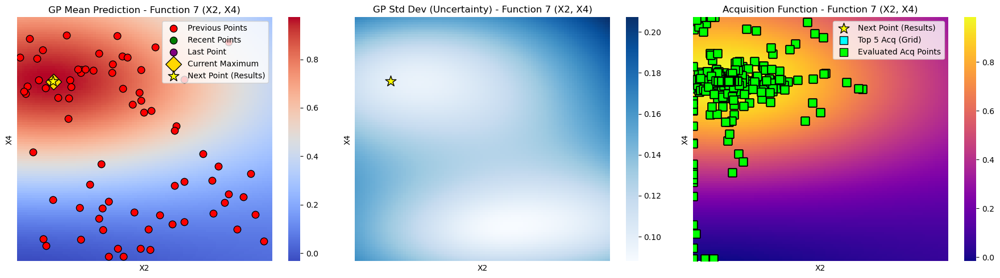

Plotting pair (X2, X5) for Function 7...


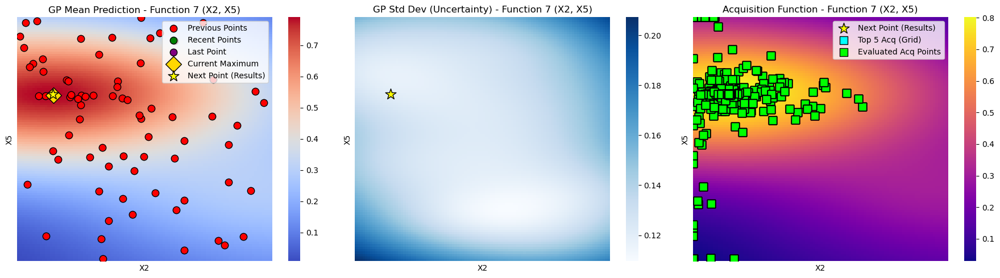

Plotting pair (X2, X6) for Function 7...


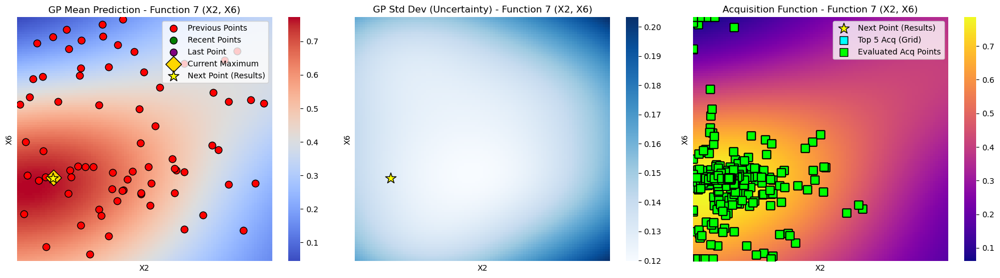

Plotting pair (X3, X4) for Function 7...


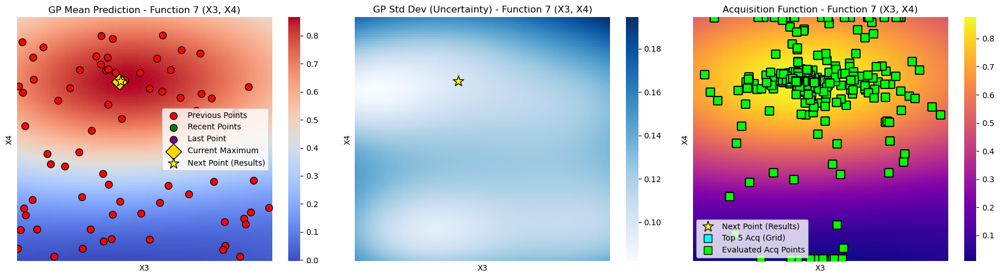

Plotting pair (X3, X5) for Function 7...


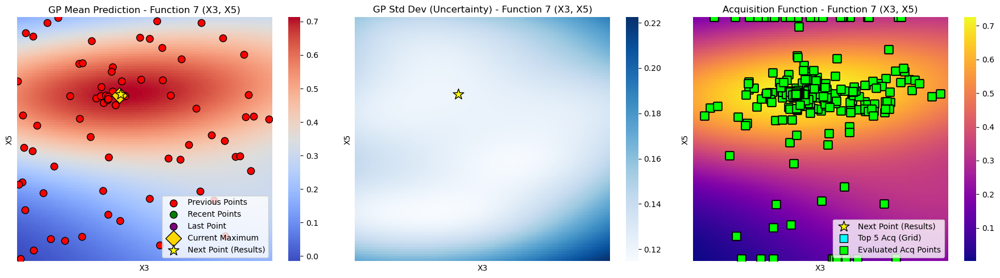

Plotting pair (X3, X6) for Function 7...


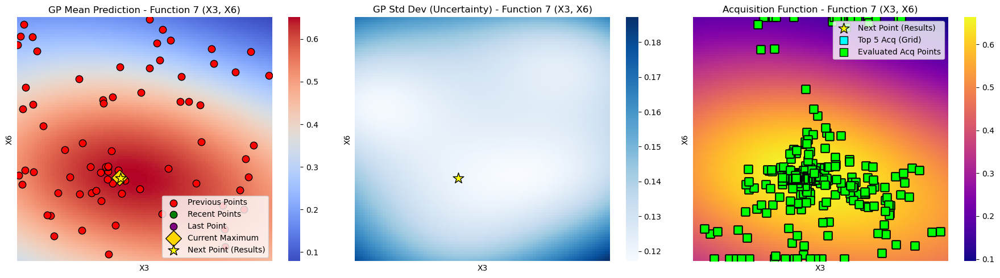

Plotting pair (X4, X5) for Function 7...


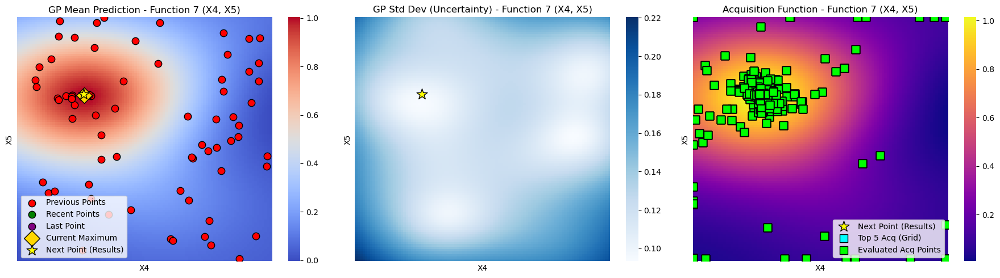

Plotting pair (X4, X6) for Function 7...


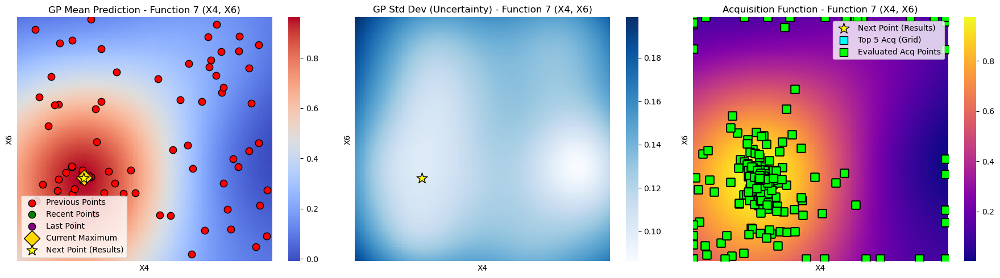

Plotting pair (X5, X6) for Function 7...


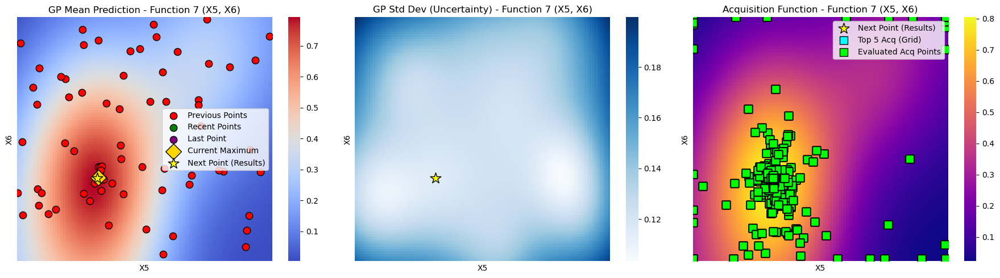

Visualizing Acquisition Function for Function 8...
Plotting pair (X1, X2) for Function 8...


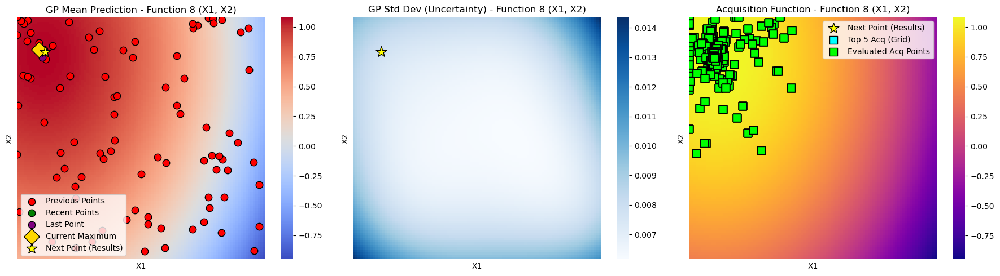

Plotting pair (X1, X3) for Function 8...


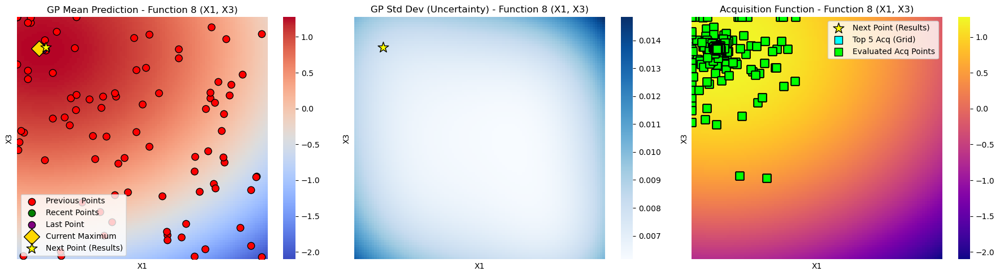

Plotting pair (X1, X4) for Function 8...


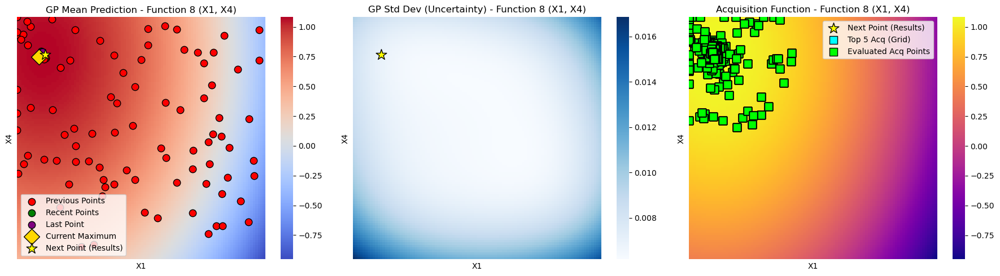

Plotting pair (X1, X5) for Function 8...


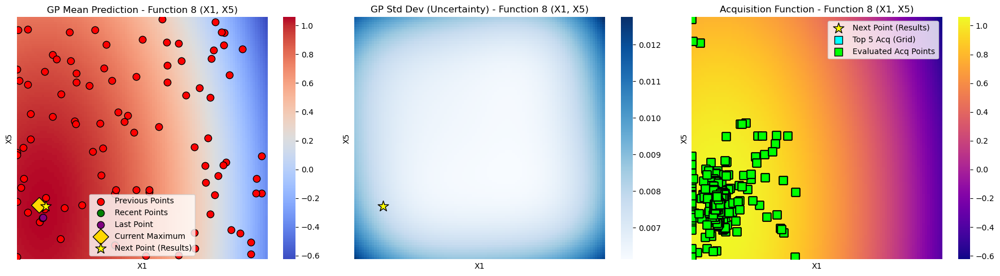

Plotting pair (X1, X6) for Function 8...


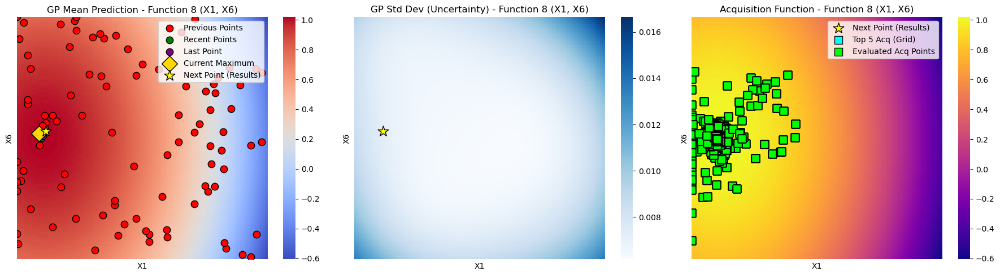

Plotting pair (X1, X7) for Function 8...


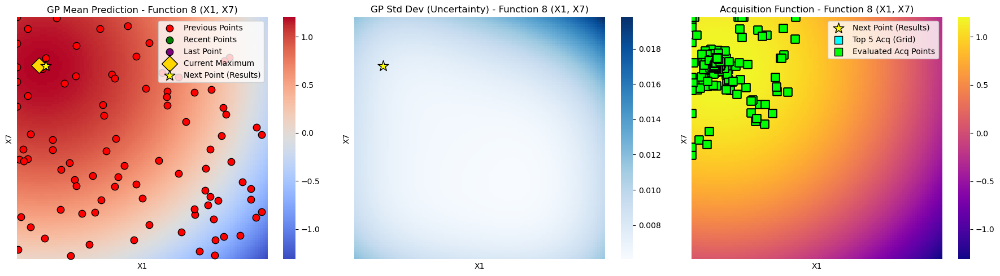

Plotting pair (X1, X8) for Function 8...


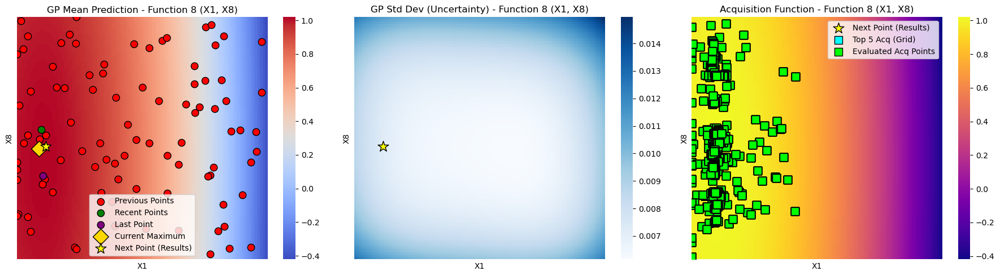

Plotting pair (X2, X3) for Function 8...


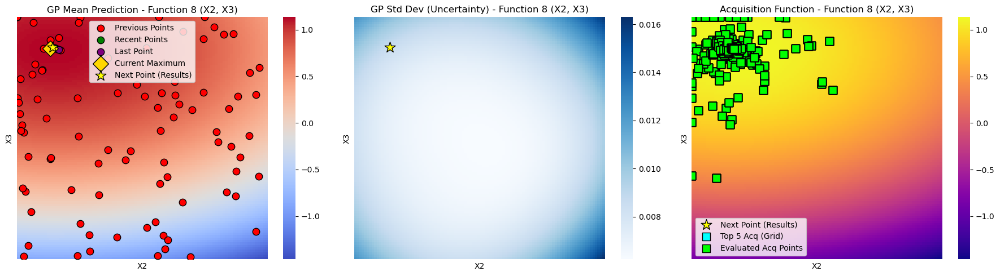

Plotting pair (X2, X4) for Function 8...


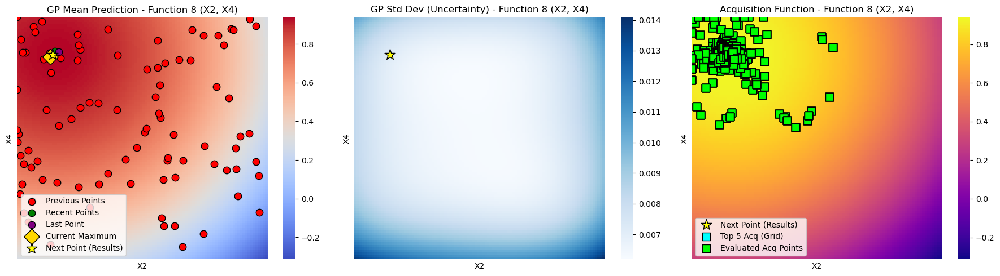

Plotting pair (X2, X5) for Function 8...


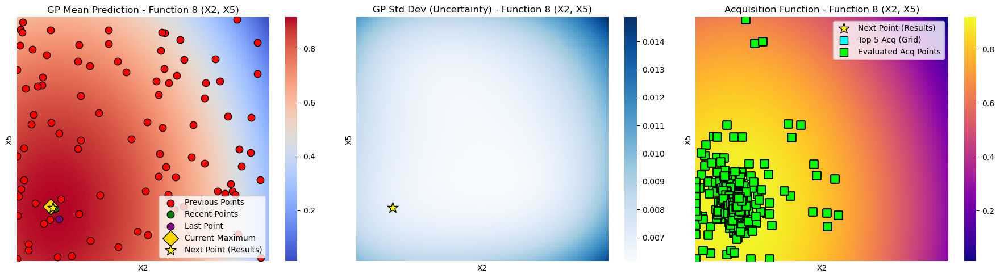

Plotting pair (X2, X6) for Function 8...


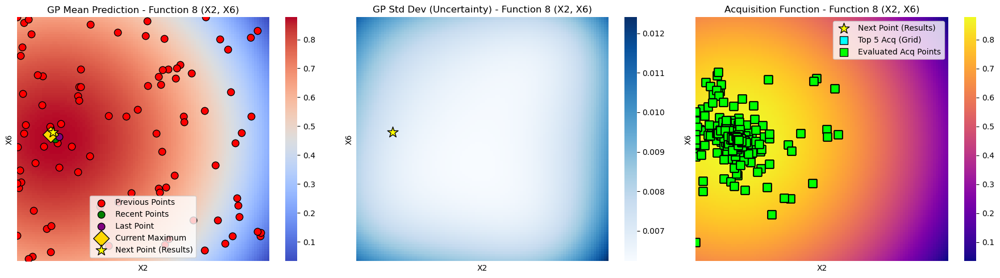

Plotting pair (X2, X7) for Function 8...


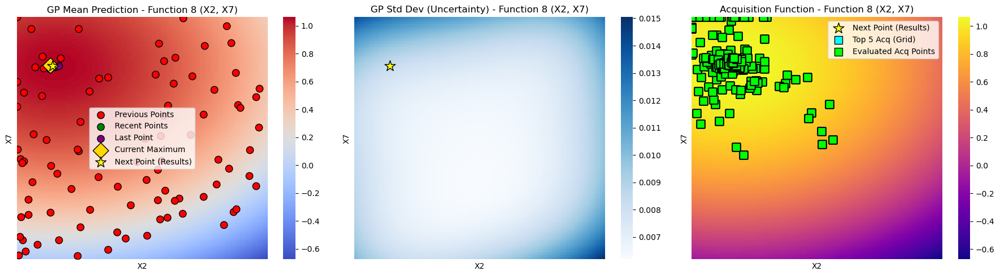

Plotting pair (X2, X8) for Function 8...


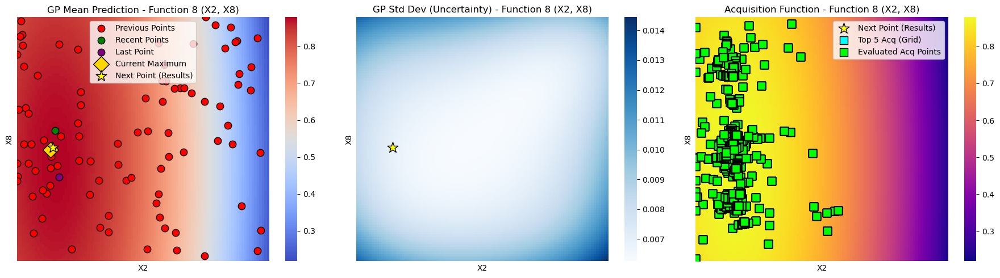

Plotting pair (X3, X4) for Function 8...


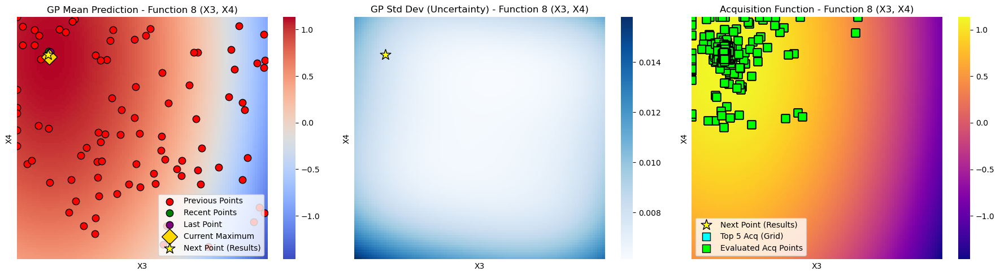

Plotting pair (X3, X5) for Function 8...


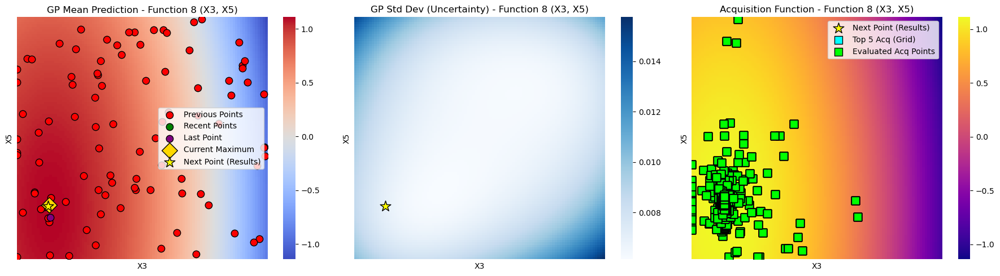

Plotting pair (X3, X6) for Function 8...


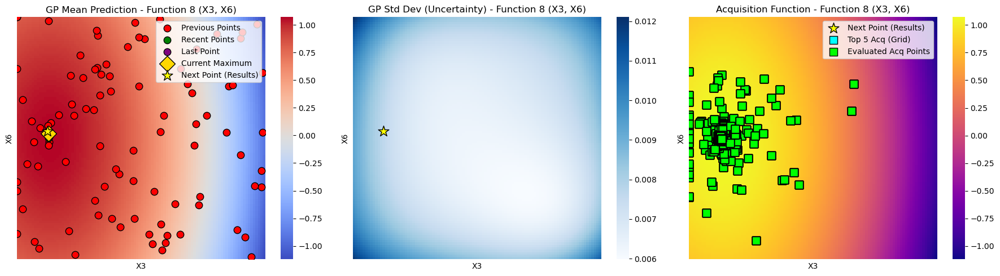

Plotting pair (X3, X7) for Function 8...


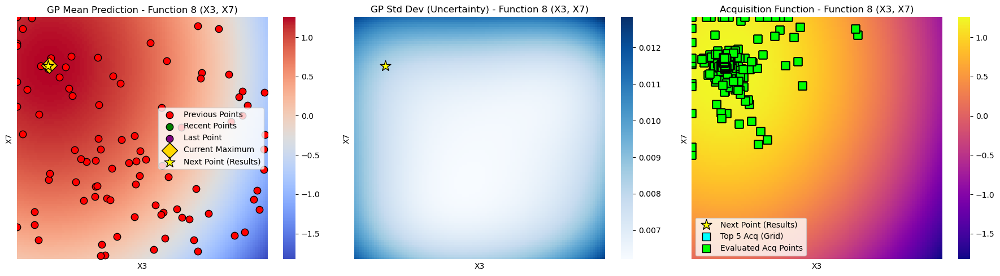

Plotting pair (X3, X8) for Function 8...


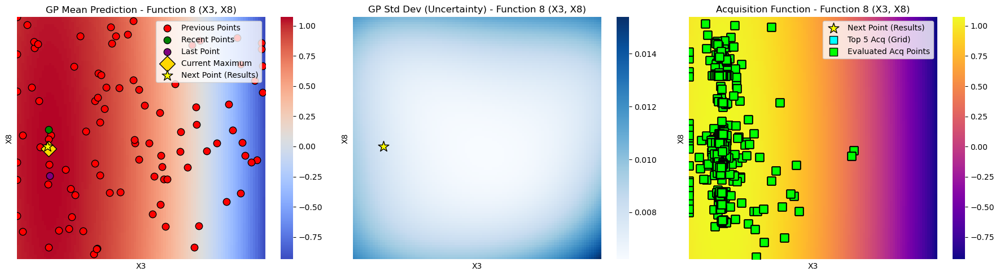

Plotting pair (X4, X5) for Function 8...


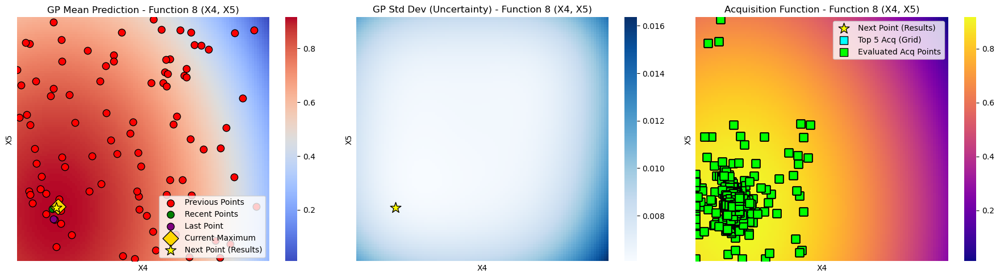

Plotting pair (X4, X6) for Function 8...


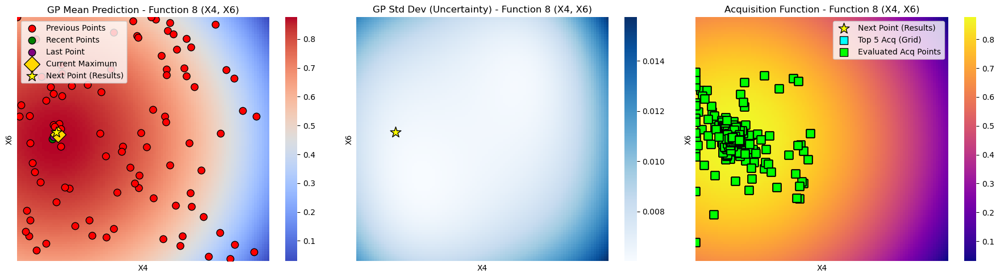

Plotting pair (X4, X7) for Function 8...


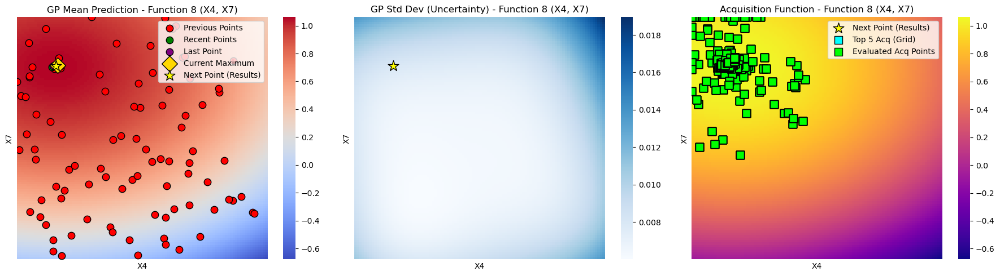

Plotting pair (X4, X8) for Function 8...


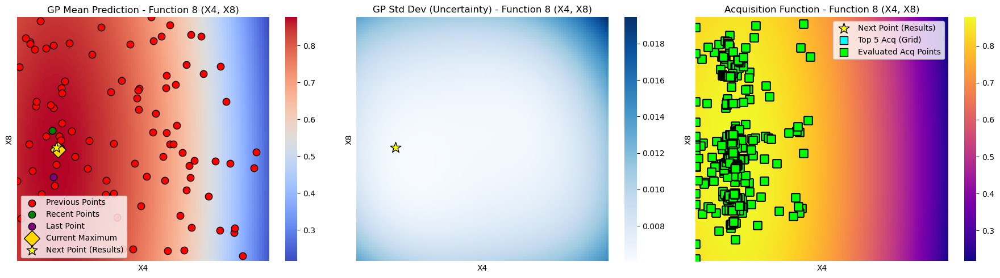

Plotting pair (X5, X6) for Function 8...


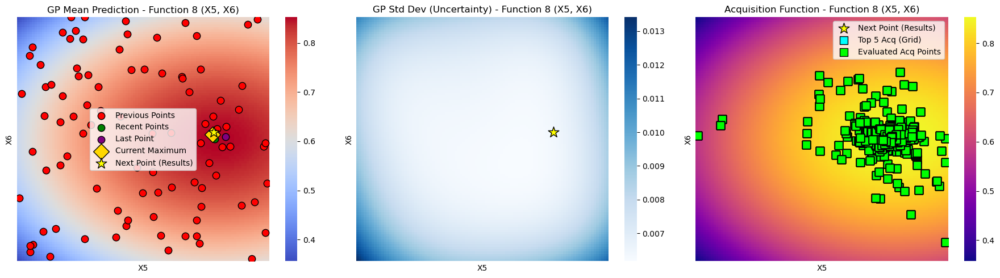

Plotting pair (X5, X7) for Function 8...


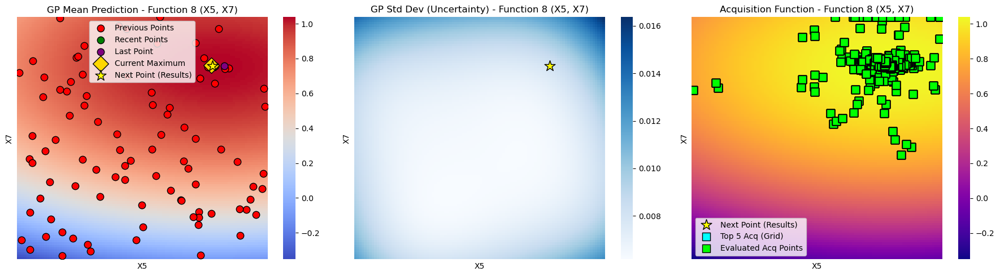

Plotting pair (X5, X8) for Function 8...


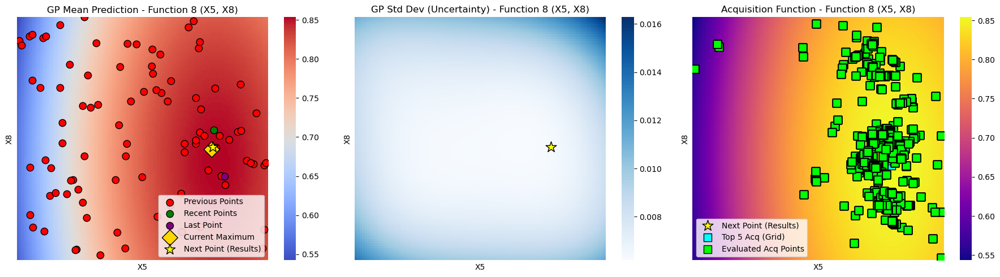

Plotting pair (X6, X7) for Function 8...


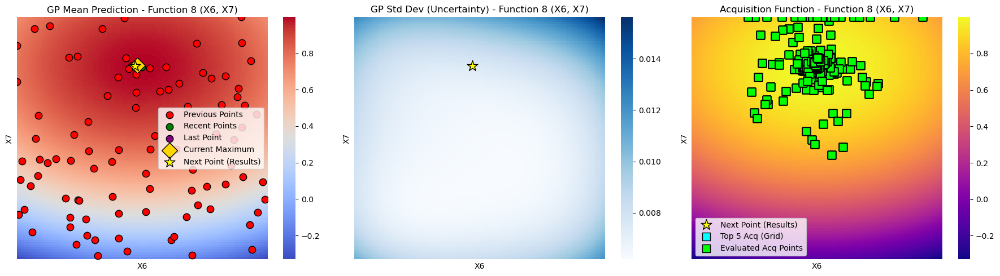

Plotting pair (X6, X8) for Function 8...


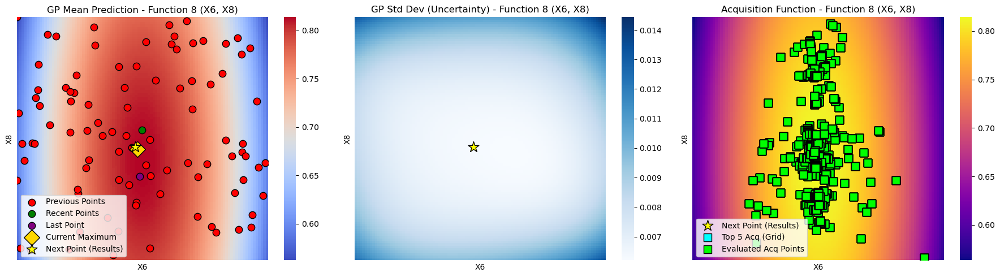

Plotting pair (X7, X8) for Function 8...


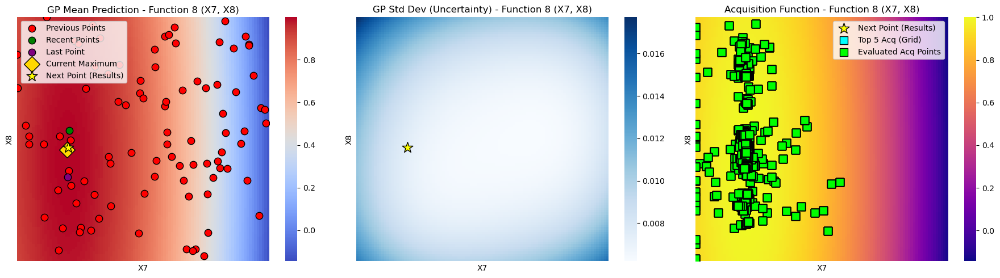

In [206]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

# Iterate through each function and generate heatmaps
for func_name, result in results_final_GP.items():
    print(f"Visualizing Acquisition Function for {func_name}...")

    # Extract GP model and acquisition function
    best_gp = result["best_gp"]
    acquisition_function = acquisition_functions[func_name]
    X_sample = result["X_sample"]
    y_sample = result["y_sample"]
    X_next = result["X_next"]  # Suggested next point from results
    evaluated_points = result["evaluated_points"]  # Evaluated acquisition function points

    # Get function-specific bounds and dimensions
    bounds = bounds_dict[func_name]
    num_dims = dimensions[func_name]

    # Find the current maximum point
    max_idx = np.argmax(y_sample)
    X_max = X_sample[max_idx]

    # If only 2D, just plot X1-X2
    dimension_pairs = [(0, 1)] if num_dims == 2 else list(itertools.combinations(range(num_dims), 2))

    # Iterate through dimension pairs
    for (dim1, dim2) in dimension_pairs:
        print(f"Plotting pair (X{dim1+1}, X{dim2+1}) for {func_name}...")

        # Generate test grid for the selected dimension pair
        grid_res = 100  # Increased resolution for smoother heatmaps
        x1_test = np.linspace(bounds[dim1, 0], bounds[dim1, 1], grid_res)
        x2_test = np.linspace(bounds[dim2, 0], bounds[dim2, 1], grid_res)
        X1_grid, X2_grid = np.meshgrid(x1_test, x2_test)

        # Generate test points with other dimensions fixed at mean
        X_mean = np.mean(X_sample, axis=0)
        X_test = np.tile(X_mean, (X1_grid.ravel().shape[0], 1))
        X_test[:, dim1] = X1_grid.ravel()
        X_test[:, dim2] = X2_grid.ravel()

        # Get GP predictions
        mu, sigma = best_gp.predict(X_test, return_std=True)
        mu = mu.reshape(X1_grid.shape)
        sigma = sigma.reshape(X1_grid.shape)

        # Compute acquisition function values
        acq_values = acquisition_function(X_test,  y_sample, X_sample, best_gp).reshape(X1_grid.shape)

        # Find top 5 acquisition points from the grid-based method
        sorted_acq_indices = np.argsort(acq_values.ravel())[::-1][:5]
        top_5_x1 = X1_grid.ravel()[sorted_acq_indices]
        top_5_x2 = X2_grid.ravel()[sorted_acq_indices]

        # **Fix coordinate mapping for Seaborn heatmaps**
        def map_to_heatmap(x, x_min, x_max, grid_size):
            """Maps real-world coordinates to the heatmap coordinate system."""
            return ((x - x_min) / (x_max - x_min)) * (grid_size - 1)

        # Scale `X_next`, `top_5`, `X_max`, and `evaluated_points` to the heatmap coordinate system
        if X_next is not None:
            X_next_scaled = np.array([
                map_to_heatmap(X_next[dim1], bounds[dim1, 0], bounds[dim1, 1], grid_res),
                map_to_heatmap(X_next[dim2], bounds[dim2, 0], bounds[dim2, 1], grid_res)
            ])

        # Scale current maximum point to heatmap coordinates
        X_max_scaled = np.array([
            map_to_heatmap(X_max[dim1], bounds[dim1, 0], bounds[dim1, 1], grid_res),
            map_to_heatmap(X_max[dim2], bounds[dim2, 0], bounds[dim2, 1], grid_res)
        ])

        top_5_scaled = np.array([
            map_to_heatmap(top_5_x1, bounds[dim1, 0], bounds[dim1, 1], grid_res),
            map_to_heatmap(top_5_x2, bounds[dim2, 0], bounds[dim2, 1], grid_res)
        ]).T

        if evaluated_points is not None:
            evaluated_points_scaled = np.array([
                map_to_heatmap(evaluated_points[:, dim1], bounds[dim1, 0], bounds[dim1, 1], grid_res),
                map_to_heatmap(evaluated_points[:, dim2], bounds[dim2, 0], bounds[dim2, 1], grid_res)
            ]).T

        # Create figure with 3 subplots
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))

        #  Plot 1: GP Mean Prediction
        ax = axes[0]
        sns.heatmap(mu, xticklabels=False, yticklabels=False, cmap="coolwarm", ax=ax, annot=False)
        
        # Separate points into three categories: older points, recent points (2nd and 3rd to last), and the last point
        n_samples = X_sample.shape[0]
        
        # Handle the older points (all except last 3)
        if n_samples > 3:
            older_points = X_sample[:-3]
            ax.scatter(map_to_heatmap(older_points[:, dim1], bounds[dim1, 0], bounds[dim1, 1], grid_res),
                      map_to_heatmap(older_points[:, dim2], bounds[dim2, 0], bounds[dim2, 1], grid_res),
                      color="red", marker="o", s=80, label="Previous Points", edgecolors="black")
        
        # Handle the 2nd and 3rd to last points (if they exist)
        if n_samples >= 3:
            recent_points = X_sample[-3:-1]
            ax.scatter(map_to_heatmap(recent_points[:, dim1], bounds[dim1, 0], bounds[dim1, 1], grid_res),
                      map_to_heatmap(recent_points[:, dim2], bounds[dim2, 0], bounds[dim2, 1], grid_res),
                      color="green", marker="o", s=80, label="Recent Points", edgecolors="black")
        elif n_samples >= 2:
            # If only 2 points exist, the 2nd-to-last is shown in green
            recent_points = X_sample[-2:-1]
            ax.scatter(map_to_heatmap(recent_points[:, dim1], bounds[dim1, 0], bounds[dim1, 1], grid_res),
                      map_to_heatmap(recent_points[:, dim2], bounds[dim2, 0], bounds[dim2, 1], grid_res),
                      color="green", marker="o", s=80, label="Recent Points", edgecolors="black")
        
        # Always plot the last point in a different color (if there's at least one point)
        if n_samples >= 1:
            last_point = X_sample[-1:]
            ax.scatter(map_to_heatmap(last_point[:, dim1], bounds[dim1, 0], bounds[dim1, 1], grid_res),
                      map_to_heatmap(last_point[:, dim2], bounds[dim2, 0], bounds[dim2, 1], grid_res),
                      color="purple", marker="o", s=80, label="Last Point", edgecolors="black")

        # Add the current maximum point with a distinctive marker and color
        ax.scatter(X_max_scaled[0], X_max_scaled[1], color="gold", marker="D", s=200, 
                  label=f"Current Maximum", edgecolors="black")

        if X_next is not None:
            ax.scatter(X_next_scaled[0], X_next_scaled[1], color="yellow", marker="*", s=200, label="Next Point (Results)", edgecolors="black")

        ax.set_title(f"GP Mean Prediction - {func_name} (X{dim1+1}, X{dim2+1})")
        ax.set_xlabel(f"X{dim1+1}")
        ax.set_ylabel(f"X{dim2+1}")
        ax.legend()

        #  Plot 2: GP Standard Deviation (Uncertainty)
        ax = axes[1]
        sns.heatmap(sigma, xticklabels=False, yticklabels=False, cmap="Blues", ax=ax, annot=False)

        if X_next is not None:
            ax.scatter(X_next_scaled[0], X_next_scaled[1], color="yellow", marker="*", s=200, label="Next Point (Results)", edgecolors="black")

        ax.set_title(f"GP Std Dev (Uncertainty) - {func_name} (X{dim1+1}, X{dim2+1})")
        ax.set_xlabel(f"X{dim1+1}")
        ax.set_ylabel(f"X{dim2+1}")

        #  Plot 3: Acquisition Function Heatmap
        ax = axes[2]
        sns.heatmap(acq_values, xticklabels=False, yticklabels=False, cmap="plasma", ax=ax, annot=False)

        if X_next is not None:
            ax.scatter(X_next_scaled[0], X_next_scaled[1], color="yellow", marker="*", s=200, label="Next Point (Results)", edgecolors="black")

        ax.scatter(top_5_scaled[:, 0], top_5_scaled[:, 1], color="cyan", marker="s", s=100, label="Top 5 Acq (Grid)", edgecolors="black")

        if evaluated_points is not None:
            ax.scatter(evaluated_points_scaled[:, 0], evaluated_points_scaled[:, 1], color="lime", marker="s", s=100, label="Evaluated Acq Points", edgecolors="black")

        ax.set_title(f"Acquisition Function - {func_name} (X{dim1+1}, X{dim2+1})")
        ax.set_xlabel(f"X{dim1+1}")
        ax.set_ylabel(f"X{dim2+1}")
        ax.legend()

        plt.tight_layout()
        plt.show()

**Visualise - keeping other x dimensions at average**

Generating plots for Function 1...


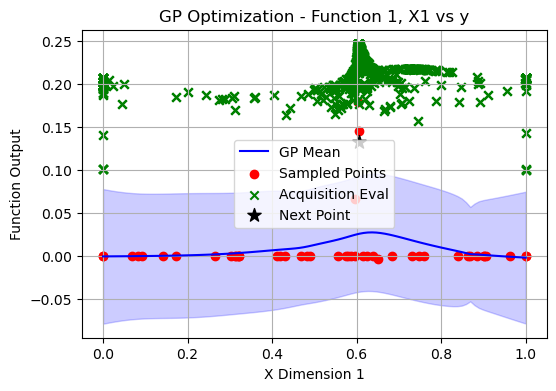

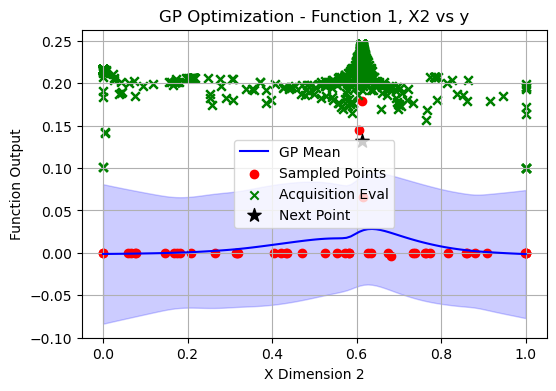

Generating plots for Function 2...


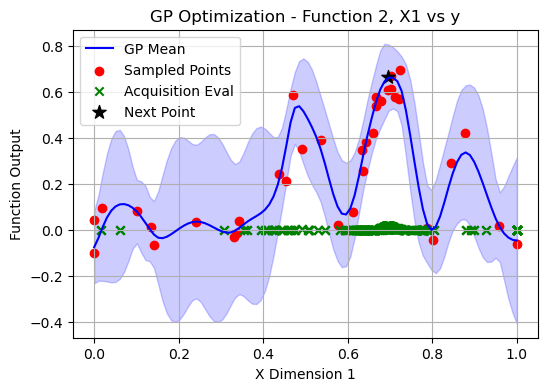

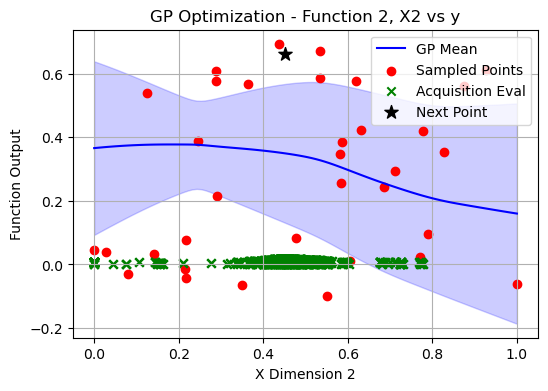

Generating plots for Function 3...


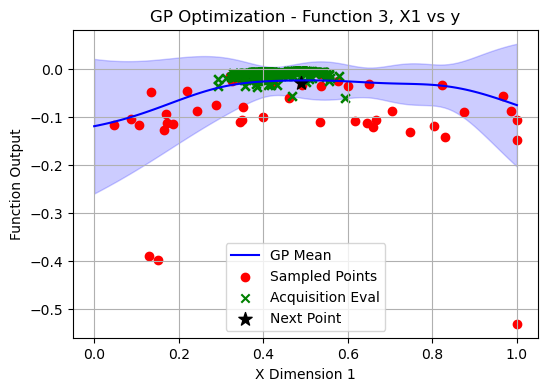

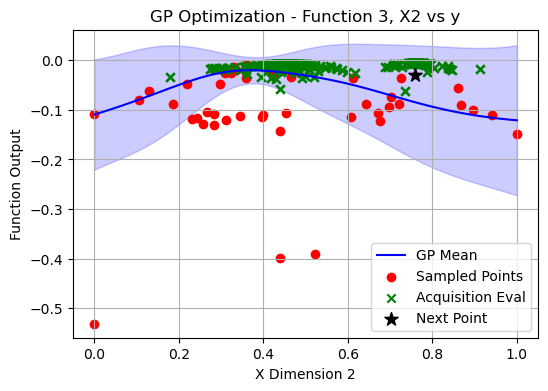

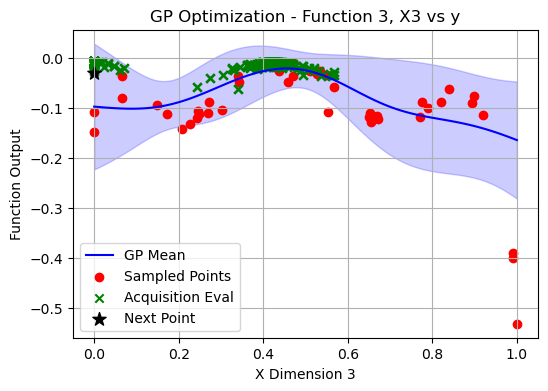

Generating plots for Function 4...


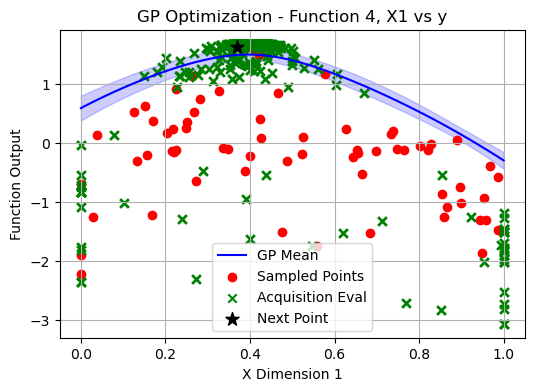

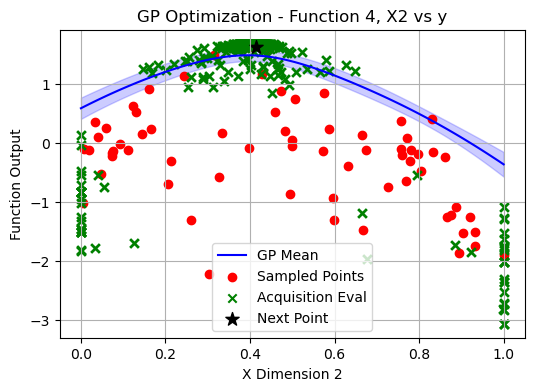

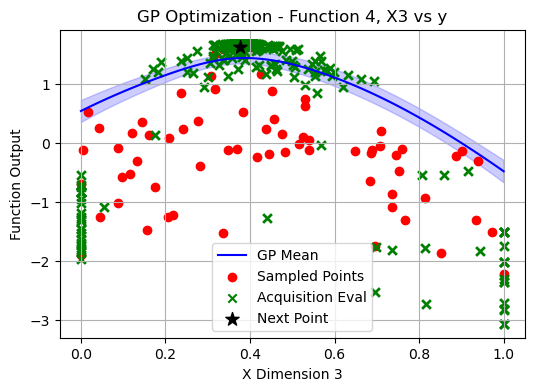

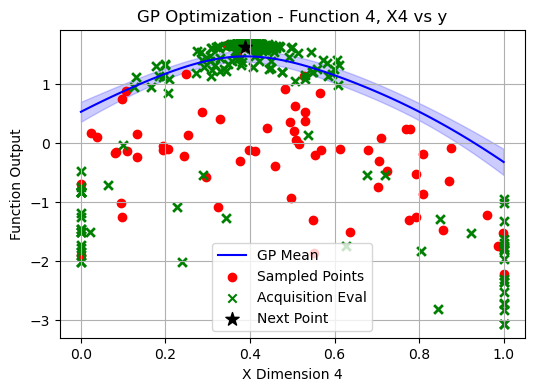

Generating plots for Function 5...


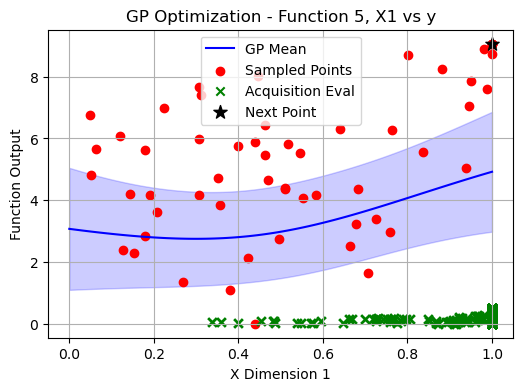

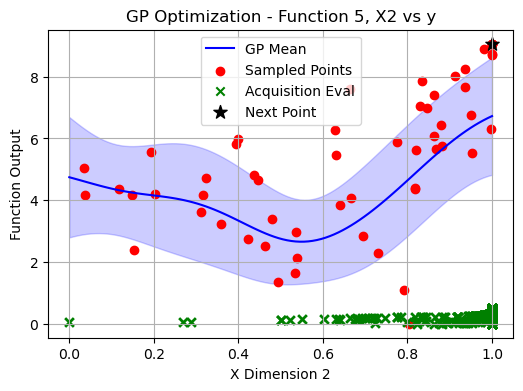

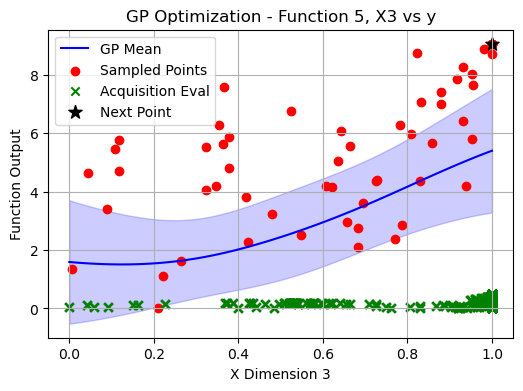

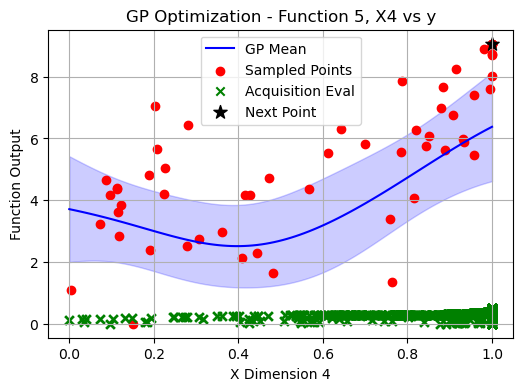

Generating plots for Function 6...


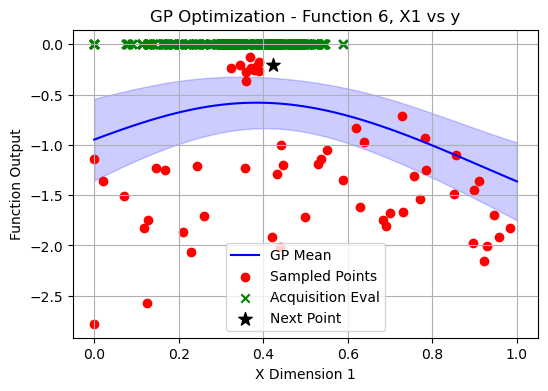

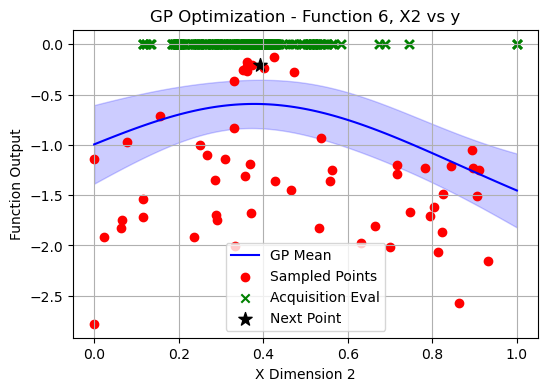

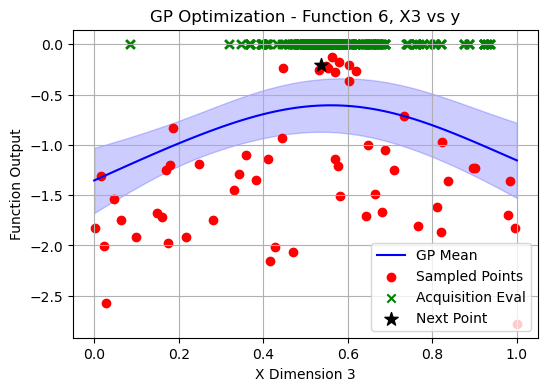

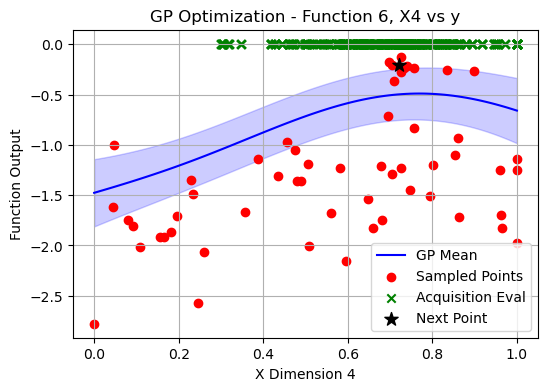

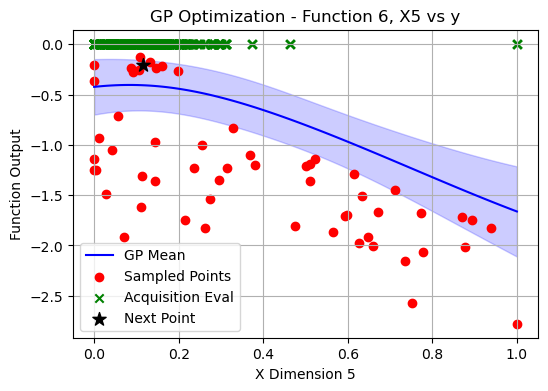

Generating plots for Function 7...


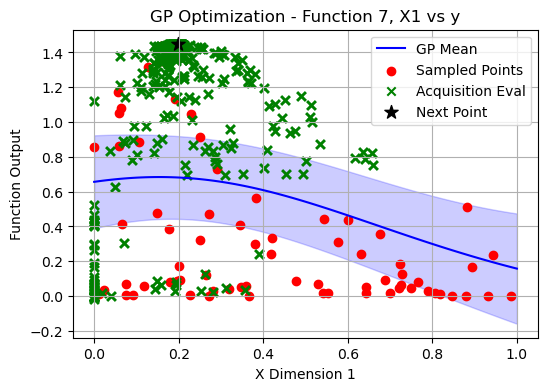

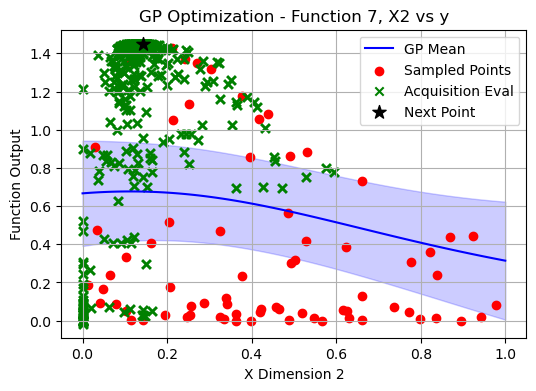

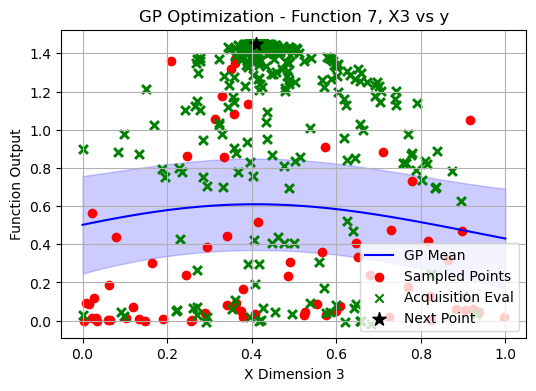

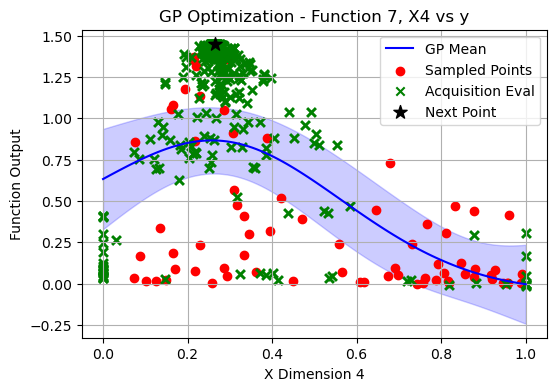

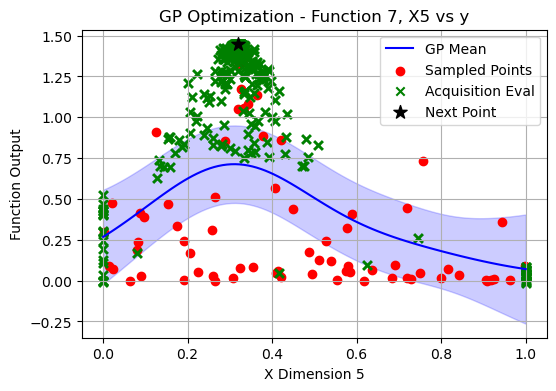

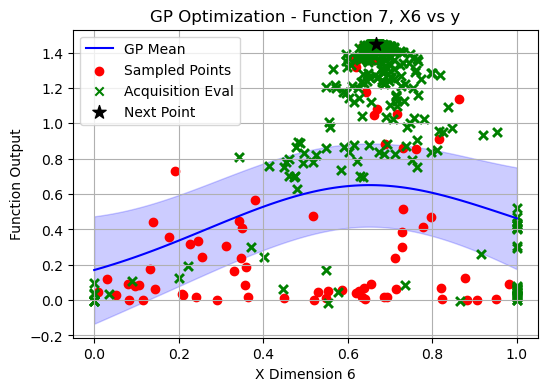

Generating plots for Function 8...


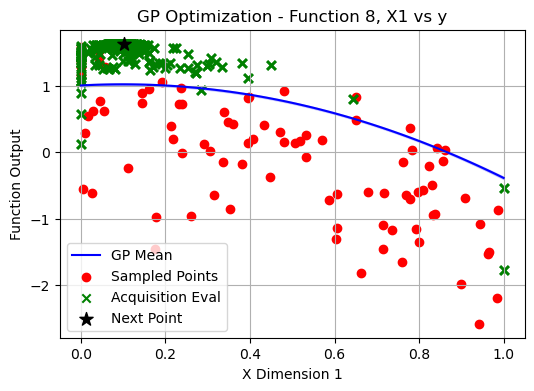

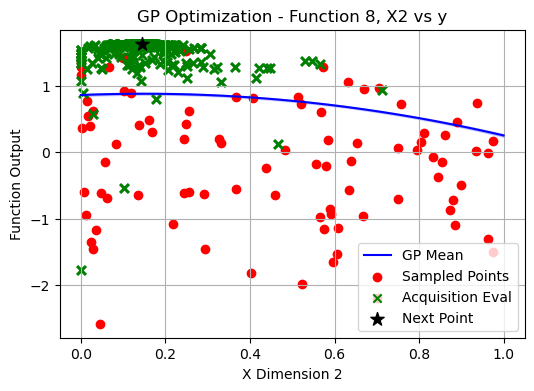

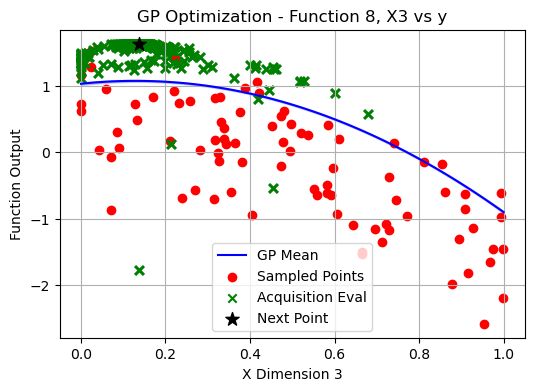

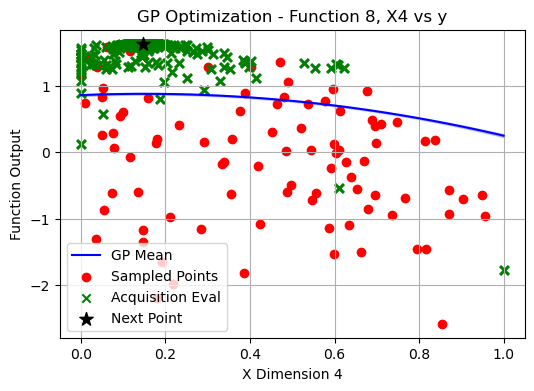

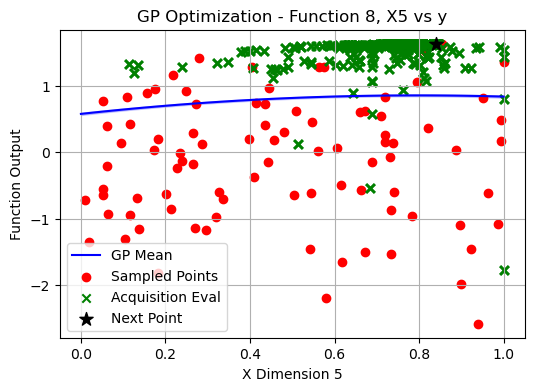

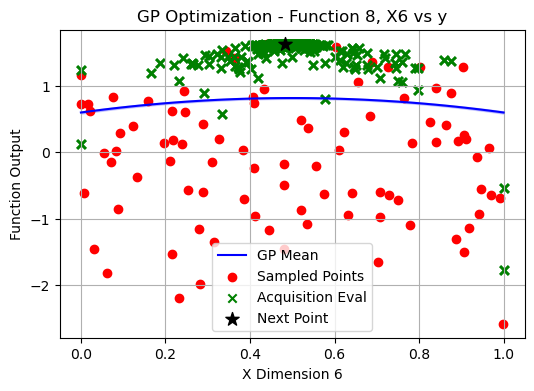

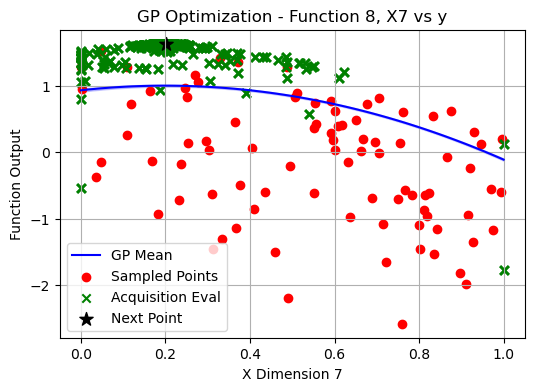

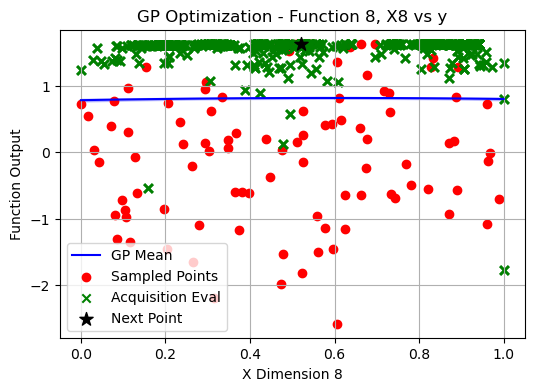

In [182]:
# Iterate through each function and generate plots
for func_name, result in results_final_GP.items():
    print(f"Generating plots for {func_name}...")

    # Extract relevant data
    best_gp = result["best_gp"]
    X_next = result["X_next"]
    evaluated_points = result["evaluated_points"]
    evaluated_values = result["evaluated_values"]
    X_sample = result["X_sample"]
    y_sample = result["y_sample"]
    
    # Get function-specific bounds and dimensions
    bounds = bounds_dict[func_name]
    num_dims = dimensions[func_name]

    # Compute the mean of each dimension from the sampled data
    X_mean = np.mean(X_sample, axis=0)

    # Create a plot for each dimension
    for dim in range(num_dims):
        plt.figure(figsize=(6, 4))
        
        # Generate test data for plotting (varying one dimension, keeping others at their mean)
        X_test = np.linspace(bounds[dim, 0], bounds[dim, 1], 100).reshape(-1, 1)
        X_test_full = np.tile(X_mean, (100, 1))  # Create a full array of mean values
        X_test_full[:, dim] = X_test[:, 0]  # Only vary the selected dimension

        # GP Prediction
        mu, std = best_gp.predict(X_test_full, return_std=True)
        
        # Plot GP mean and confidence interval
        plt.plot(X_test[:, 0], mu, "b-", label="GP Mean")
        plt.fill_between(X_test[:, 0], mu - 1.96 * std, mu + 1.96 * std, color="blue", alpha=0.2)

        # Scatter plot of sampled points
        plt.scatter(X_sample[:, dim], y_sample, color="red", label="Sampled Points")

        # Evaluated acquisition points
        if evaluated_points is not None and len(evaluated_points) > 0:
            plt.scatter(evaluated_points[:, dim], evaluated_values, color="green", label="Acquisition Eval", marker="x")

        # Next suggested point
        if X_next is not None:
            plt.scatter(X_next[dim], best_gp.predict(X_next.reshape(1, -1)), color="black", marker="*", s=100, label="Next Point")

        # Formatting the plot
        plt.xlabel(f"X Dimension {dim+1}")
        plt.ylabel("Function Output")
        plt.title(f"GP Optimization - {func_name}, X{dim+1} vs y")
        plt.legend()
        plt.grid()
        plt.show()


**Function one: 2-dimensional - searching for Contamination Sources**

This may sound simple because you only have a two-dimensional input, however it is a very difficult problem. It corresponds to trying to find the source of radiation in some square area. However, you can only detect the radiation once you are very close to it, meaning most of the readings will be zero. There are two sources, one is not too dangerous, so make sure you try to find both modes of the function.

https://towardsdatascience.com/bayesian-optimization-a-step-by-step-approach-a1cb678dd2ec
https://distill.pub/2019/visual-exploration-gaussian-processes/


**Function two: 2-dimensional - optimising noisy data**

This corresponds to trying to optimise an unknown machine learning model. However, the initialization of the model is very important, meaning your observations will be very noisy, and the problem might have a lot of local optima! You are trying to make the model’s log-likelihood as large as possible.

**Function three: 3-dimensional - drug discovery problem, closest to 0**

In this example, you are doing drug discovery! You can select three compounds to create a drug, and receive a measurement of the people’s adverse reaction to the drug. You want to make this as close as possible to zero. (hint: one of the variables may not cause any effects on the person).

**Function four: 4-dimensional - fast, but inaccurate modelling**

This example is for a particular business relying heavily on online sales. It can run very accurate calculations to figure out what is the optimal placement of their product across warehouses. Unfortunately, the calculations are extremely expensive (computationally) to run, so they can only do it once every two weeks. Instead, they propose using a machine learning model which approximates the solution quickly (in a few hours). The model has four hyper-parameters you need to tune, and the output corresponds to the difference between the expensive calculation, and the model. Since you are modelling a dynamical system, expect a lot of local optima!

**Function five: 4-dimensional - yield in a chemical reaction**

This time you are trying to optimise another four-dimensional black-box. It corresponds to the yield of a chemical process after processing in some factory. This type of process tends to be unimodal. Try to find the combination of chemicals that maximizes the yield!

**Function six: 5-dimensional - cake and stuff**

Time to get cooking! You are optimising a cake recipe. There are five ingredients. The outputs correspond to the sum of different objectives: flavor, consistency, calories, waste and cost. Each objective receives negative points by our expert taster. You want this sum to be as close to zero as possible!

**Function seven: 6-dimensional - Sometimes lasy is best**

You are now optimising six hyper-parameters of a machine learning model. Note that it is a popular and frequently used model, so maybe you could search to see if anyone else has optisized it before?

**Function eight: 8-dimensional - High-dimensional Optimisation MAXIMISATION**

You’ve reach the final, 8-dimensional search space. High-dimensional black-box optimisation can be very difficult, so sticking to local solutions is not the worst idea here.